<div class="alert alert-block alert-info">
<center> <h1> MACHINE LEARNING MDSAA-BA </h1> </center> <br>
<center> The Smith Parasite - An Unknown Parasitic Disease 2022/2023 </center>

**Table of Contents** <br>
* [1 Import](#IMPORT)
    * [1.1 Libraries](#LIBRARIES)
    * [1.2 Datasets](#DATA)
* [2 Data Exploration](#EXPLORATION)
    * [2.1 Missing Values](#MISSINGVALUES)
    * [2.2 Data Visualization](#VISUALIZATION)
* [3 Feature Engineering](#FEATURE.ENGINEERING)
    * [3.1 Data Visualization](#ENGINEERING.VIZ)
* [4 Outliers Handling](#OUTLIER.HANDLING)
    * [4.1 Numeric](#OUTLIER.NUMERIC)
        * [4.1.1 Applying Outlier Solution](#NUMERIC.SOLUTION)
    * [4.2 Categoric](#OUTLIER.CATEGORIC)
        * [4.2.1 Comparing categoric and numeric features](#CATEGORIC.COMPARISON)
* [5 Feature Selection](#FEATURE.SELECTION)
    * [5.1 Numeric](#NUMERIC.SELECTION)
        * [5.1.1 Handling Missing Values](#NUMERIC.MISSINGVALUES)
        * [5.1.2 Scaling](#FEATURE.SCALING)
        * [5.1.3 Spearman Correlation](#NUMERIC.CORRELATION)
        * [5.1.4 Wrapper Methods](#NUMERIC.SELECTION.METHODS)
        * [5.1.5 Decision](#NUMERIC.SELECTION.DECISION)
    * [5.2 Categoric](#CATEGORIC.SELECTION)
        * [5.2.1 Chi-Square Test](#CATEGORIC.CHI)
        * [5.2.2 Decision](#CATEGORIC.DECISION)
    * [5.3 Selecting Relevant Features](#DROPPING.FEATURES)
* [6 Feature Encoding](#FEATURE.ENCODING)  
* [7 Model Training](#MODEL.TRAINING) 
    * [7.1 Models](#MODEL)
        * [7.1.1 Logistic Regression](#MODEL.LR)
        * [7.1.2 Neural Network](#MODEL.NN)        
        * [7.1.3 Ensemble - Bagging](#MODEL.BAGGING)     
        * [7.1.4 Ensemble - Random Forest](#MODEL.RANDOMFORAST)        
        * [7.1.5 Ensemble - Adaptive Boosting](#MODEL.ADABOOST)      
        * [7.1.6 Ensemble - Gradient Boosting](#MODEL.GRADIENTBOOSTING)         
* [8 Model Testing](#TESTING)
* [9 Model Deployment](#DEPLOYMENT) 

<a class="anchor" id="IMPORT">

# 1. Import

</a>

<a class="anchor" id="LIBRARIES">

## 1.1 Libraries

</a>

In [1]:
import pandas as pd
import pandas_profiling
import numpy as np
import seaborn as sns
import tkinter
import matplotlib.pyplot as plt
%matplotlib inline
from math import ceil

#importing plotly and cufflinks in offline mode
import cufflinks as cf
import plotly.offline
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

# Data Partition
from sklearn.model_selection import train_test_split, StratifiedKFold, RepeatedStratifiedKFold

# Scalers
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler

# Dummy Variables
from sklearn.preprocessing import OneHotEncoder

# Filter methods
# spearman 
# chi-square
import scipy.stats as stats
from scipy.stats import chi2_contingency
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2


# Wrapper methods
from sklearn.feature_selection import RFE
# Embedded methods
from sklearn.linear_model import LassoCV

# Models
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier


# Evaluation
from sklearn import metrics
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score, classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV, cross_val_score
from mlxtend.plotting import plot_decision_regions
from sklearn.datasets import make_classification, make_moons

import time
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import validation_curve

<a class="anchor" id="DATA">

## 1.2. Dataset

</a>

In [2]:
# Sociodemographic Data
train_demo = pd.read_excel('train_demo.xlsx')
# Health Related Data
train_habits = pd.read_excel('train_habits.xlsx')
# Habits related Data
train_health = pd.read_excel('train_health.xlsx')

In [3]:
# Checking if the provided tables share a forein key
print(train_demo["PatientID"].equals(train_habits["PatientID"]))
print(train_demo["PatientID"].equals(train_health["PatientID"]))
print(train_health["PatientID"].equals(train_habits["PatientID"]))

True
True
True


In [4]:
# Given that a forein key is shared we can now safely merge the three tables into a single dataframe
train_dataset = pd.merge(pd.merge(train_demo, train_habits, on="PatientID"),train_health,on="PatientID")
train_dataset = train_dataset [["PatientID","Name","Birth_Year","Region","Education","Height","Weight","Checkup","Diabetes","High_Cholesterol","Blood_Pressure","Mental_Health","Physical_Health","Exercise","Smoking_Habit","Drinking_Habit","Fruit_Habit","Water_Habit","Disease"]]
# And check the first 5 rows:
train_dataset.head()

,PatientID,Name,Birth_Year,Region,Education,Height,Weight,Checkup,Diabetes,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Exercise,Smoking_Habit,Drinking_Habit,Fruit_Habit,Water_Habit,Disease
0,1167,Mrs. Stephanie Gay,1965,London,High School Incomplete (10th to 11th grade),155,67,More than 3 years,Neither I nor my immediate family have diabetes.,358,120,21,2,Yes,No,I usually consume alcohol every day,Less than 1. I do not consume fruits every day.,Between one liter and two liters,1
1,1805,Mr. Sherman Nero,1969,South West,High School Incomplete (10th to 11th grade),173,88,Not sure,Neither I nor my immediate family have diabetes.,230,142,9,0,Yes,No,I consider myself a social drinker,Less than 1. I do not consume fruits every day.,Between one liter and two liters,1
2,1557,Mr. Mark Boller,1974,Yorkshire and the Humber,Elementary School (1st to 9th grade),162,68,More than 3 years,Neither I nor my immediate family have diabetes.,226,122,26,0,No,No,I consider myself a social drinker,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter,1
3,1658,Mr. David Caffee,1958,London,University Complete (3 or more years),180,66,Not sure,I have/had pregnancy diabetes or borderline di...,313,125,13,8,Yes,No,I usually consume alcohol every day,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter,0
4,1544,Mr. Gerald Emery,1968,South East,University Incomplete (1 to 2 years),180,58,More than 3 years,I have/had pregnancy diabetes or borderline di...,277,125,18,2,No,No,I consider myself a social drinker,1 to 2 pieces of fruit in average,More than half a liter but less than one liter,1


<a class="anchor" id="EXPLORATION">

# 2. Data Exploration

</a>

<a class="anchor" id="RAWVIZ">

## 2.1 Data Visualization

</a>

In [5]:
# Pandas Profiling
train_dataset.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# Exporting Pandas Profile
#profile = train_dataset.profile_report(title='Pandas Profiling Report')
#profile.to_file(output_file="train_dataset profiling.html")

<a class="anchor" id="MISSINGVALUES">

## 2.2 Missing Values

</a>

In [7]:
# Check if there are duplicated observations
train_dataset.duplicated().sum()

0

In [8]:
# Replace all blank spaces with nan
train_dataset.replace('', np.nan, inplace=True)

In [9]:
# Checking if there are any missing values:
train_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 800 entries, 0 to 799
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   PatientID         800 non-null    int64 
 1   Name              800 non-null    object
 2   Birth_Year        800 non-null    int64 
 3   Region            800 non-null    object
 4   Education         787 non-null    object
 5   Height            800 non-null    int64 
 6   Weight            800 non-null    int64 
 7   Checkup           800 non-null    object
 8   Diabetes          800 non-null    object
 9   High_Cholesterol  800 non-null    int64 
 10  Blood_Pressure    800 non-null    int64 
 11  Mental_Health     800 non-null    int64 
 12  Physical_Health   800 non-null    int64 
 13  Exercise          800 non-null    object
 14  Smoking_Habit     800 non-null    object
 15  Drinking_Habit    800 non-null    object
 16  Fruit_Habit       800 non-null    object
 17  Water_Habit     

<div class="alert alert-block alert-danger">  
Feature "Education" has 13 missing values, 1.625% of our dataset   
</div>

In [10]:
# Describe dataset
train_dataset.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
PatientID,800.0,NaN,NaN,NaN,1513.99875,300.87463,1001.0,1247.5,1519.5,1777.25,2024.0
Name,800,799,Mr. Gary Miller,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Birth_Year,800.0,NaN,NaN,NaN,1966.04375,15.421872,1855.0,1961.0,1966.0,1974.0,1993.0
Region,800,10,East Midlands,154,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Education,787,6,University Complete (3 or more years),239,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Height,800.0,NaN,NaN,NaN,167.80625,7.976888,151.0,162.0,167.0,173.0,180.0
Weight,800.0,NaN,NaN,NaN,67.8275,12.11347,40.0,58.0,68.0,77.0,97.0
Checkup,800,4,More than 3 years,429,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Diabetes,800,4,Neither I nor my immediate family have diabetes.,392,NaN,NaN,NaN,NaN,NaN,NaN,NaN
High_Cholesterol,800.0,NaN,NaN,NaN,249.3225,51.566631,130.0,213.75,244.0,280.0,568.0


<div class="alert alert-block alert-danger">  
<b>"High_Cholesterol"</b> and <b>"Blood_Pressure"</b> have max values that might be too extreme or clinically critical.<br>
<b>"Birth_Year"</b> has a minimum value of 1855 which would lead to an individual beyond the age of 100 years old.
</div>

## Data Visualization before Feature Engineering

In [11]:
# Creating two lists that include the numeric and categoric features
metric_features = train_dataset.describe().columns.drop("Disease").to_list()
n_metric_features = train_dataset.describe(include = ['O']).columns.to_list()

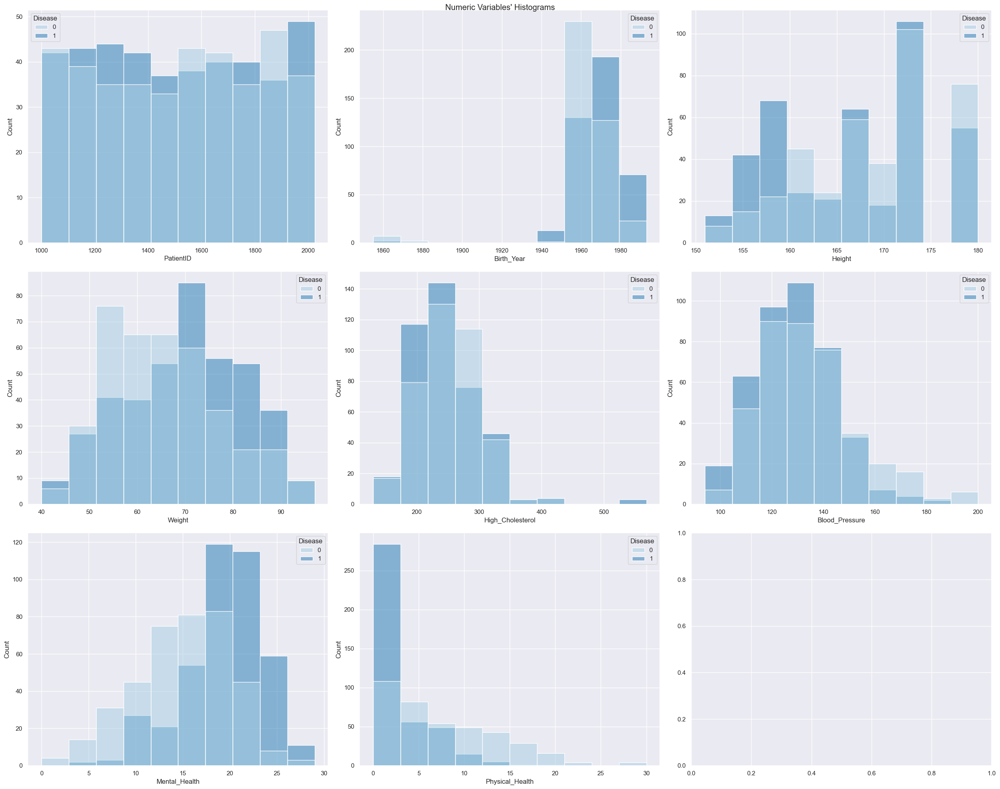

In [12]:
# Histograms of the Numeric Features
sns.set()
fig, axs = plt.subplots(3, ceil(len(metric_features) / 3), figsize=(25, 20))

for ax, bottom in zip(axs.flatten(), train_dataset[metric_features]):
    sns.histplot(ax=ax, data=train_dataset, x=bottom, hue ="Disease", bins = 10, palette = "Paired")
    
title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.tight_layout()
plt.show()

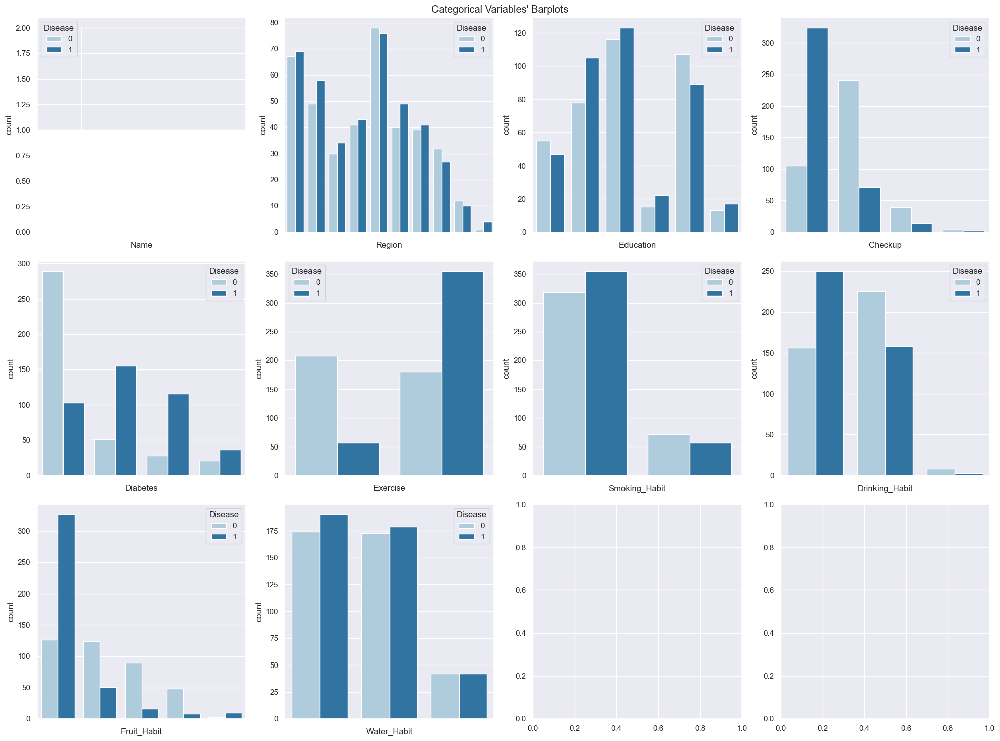

In [13]:
# Barplot of the Categorical Features
sns.set()
fig, axs = plt.subplots(3, ceil(len(n_metric_features) / 3), figsize=(20, 15))

for ax, bottom in zip(axs.flatten(), train_dataset[n_metric_features]):
    sns.countplot(ax=ax, data=train_dataset, x=train_dataset[bottom].astype(object), palette='Paired', hue = train_dataset["Disease"]).set(xticklabels=[])        

title = "Categorical Variables' Barplots"

plt.suptitle(title)
plt.tight_layout()
plt.show()

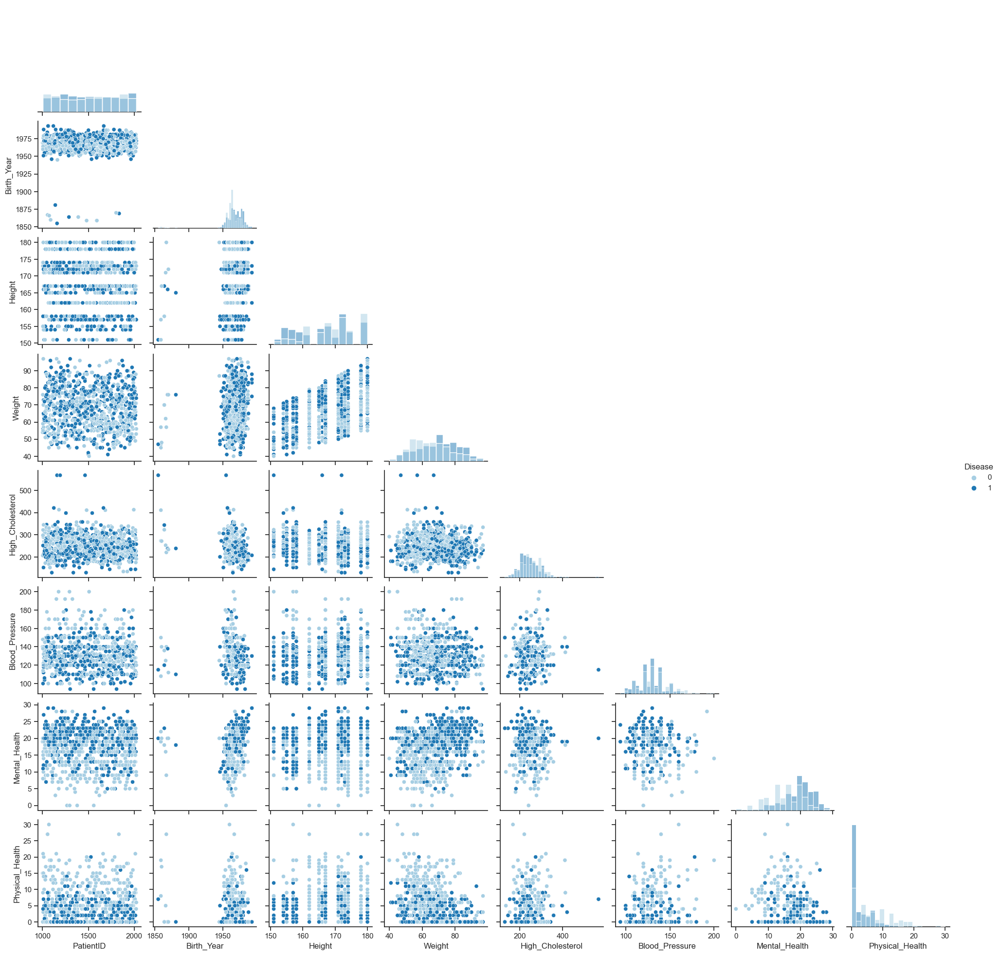

In [14]:
# Scatter Plot of how each pair of features behave towards the Target
sns.set_style("ticks")
sns.pairplot(train_dataset, hue = "Disease", diag_kind = "hist", kind = "scatter", palette = "Paired", corner = True)
plt.show()

<a class="anchor" id="FEATURE.ENGINEERING">

# 3. Feature Engineering

</a>

In [15]:
# Function to apply feature engineering to a dataframe
def feature_engineering(df):
    """Function that receives a single argument in the form of a dataframe, df.
    It performs the following actions:
    Rename variables
    Create a new feature "Age" from the existing feature "Birth_Year";
    Create a new feature "BMI_metric" from the existing features "Weight" and "Height";
    Create a new feature "BMI_noneMetric" from the feature "BMI_metric";
    Transform the value 'LONDON' into 'London' of the feauture "Region";
    Categorise the feature "Education";
    Categorise the feature "Drinking_Habit";
    Categorise the feature "Fruit_Habit";
    Categorise the feature "Water_Habit";
    Categorise the feature "Checkup";
    Categorise the feature "Diabetes";
    Set the feature "PatientID" as the dataframe index;
    Drop the features "Birth_Year" and "Name";
    Change the dataType of the feature "BMI_noneMetric" into object.
    """
    
    # Rename features
    df = df.rename(columns={"High_Cholesterol": "Cholesterol_value", "Blood_Pressure": "Blood_Pressure_value", "Mental_Health": "Mental_H_bad","Physical_Health": "Physical_H_bad"})
    
    # Create a new feature "Age" from the existing feature "Birth_Year"
    df["Age"] = 2022 - df["Birth_Year"]
    
    # Create a new feature "BMI_metric" from the existing features "Weight" and "Height"
    df["BMI_metric"] = (df["Weight"]/((df["Height"]/100)**2))
    
    # Create a new feature "BMI_noneMetric" from the feature "BMI_metric"
    bins = [0,18.5, 25, np.inf]
    names = ['Underweight', 'Normal', 'Overweight']
    df["BMI_noneMetric"] = pd.cut(df["BMI_metric"],bins,labels=names)
    
    # Transform the value 'LONDON' into 'London' of the feauture "Region"
    df["Region"] = df["Region"].str.capitalize()
    
    # Categorise the feature "Education"
    df["Education"].replace(['I never attended school / Other','Elementary School (1st to 9th grade)','High School Incomplete (10th to 11th grade)','High School Graduate','University Incomplete (1 to 2 years)', 'University Complete (3 or more years)'], 
                                   ['0','0','0','1','1','2'], inplace = True)
    
    # Categorise the feature "Drinking_Habit"
    df["Drinking_Habit"].replace(['I do not consume any type of alcohol', 'I consider myself a social drinker', 'I usually consume alcohol every day'], 
                                   ['No','No','Yes'], inplace = True)
    
    # Categorise the feature "Fruit_Habit"
    df["Fruit_Habit"].replace(["Less than 1. I do not consume fruits every day.", '1 to 2 pieces of fruit in average', '3 to 4 pieces of fruit in average', '5 to 6 pieces of fruit in average', 'More than six pieces of fruit'], 
                                   ['0','1','2','3','3'], inplace = True)
    
    # Categorise the feature "Water_Habit"
    df["Water_Habit"].replace(['Less than half a liter', 'More than half a liter but less than one liter', 'Between one liter and two liters'], 
                                   ['0','1','2'], inplace = True)
    
    # Categorise the feature "Checkup"
    df["Checkup"].replace(['Less than three months', 'Less than 3 years but more than 1 year', 'More than 3 years', 'Not sure'], 
                                   ['0','0','1','2'], inplace = True)
    
    # Categorise the feature "Diabetes"
    
    df["Diabetes"].replace(['Neither I nor my immediate family have diabetes.', 'I don\'t have diabetes, but I have direct family members who have diabetes.', 'I have/had pregnancy diabetes or borderline diabetes', 'I do have diabetes'], 
                                   ['0','1','2','3'], inplace = True)

    # Set the feature "PatientID" as the dataframe index
    df.set_index("PatientID", inplace = True)
    
    # Drop irrelevant features
    df.drop("Birth_Year", inplace = True, axis = 1)
    df.drop("Name", inplace = True, axis = 1)
    
    # Change dataType
    df.BMI_noneMetric = df.BMI_noneMetric.astype('object')

    return df

__Metadata__:

`PatientID` -> The unique identifier of the patient <br>
`Age` -> Currente Year (2022) - `Birth_Year` - Patient Year of Birth <br>
`Region` -> Patient Living Region <br>
`Education` -> What is the highest grade or year of school you have? <br>
`Height` -> Patient’s height <br>
`Weight` -> Patient’s weight <br>
`BMI_metric` -> Body mass Index = weight(kg) / [height (m)] ^2 <br>
`BMI_noneMetric` -> BMI under 18.5 'Underweight', above 18.5 and under 25 'Normal', over 25 'Overweight' 
`Checkup` -> How long has it been since you last visited a doctor for a routine Checkup? <br>
`Diabetes` -> You or your direct relatives have diabetes? <br>
`Cholesterol_value` -> Cholesterol value <br>
`Blood_Pressure_value` -> Blood Pressure in rest value <br>
`Mental_H_bad` -> During the past 30 days, for about how many days did poor physical or mental health <br>
                  keep you from doing your usual activities, such as self-care, work, or recreation? <br>
`Physical_H_bad` -> Thinking about your physical health, which includes physical illness and injury, <br>
                  for how many days during the past 30 days was your physical health not good to the point where it was <br>
                  difficult to walk? <br>
`Exercise` -> Do you exercise (more than 30 minutes) 3 times per week or more? <br>
`Smoking_Habit` -> Do you smoke more than 10 cigars daily? <br>
`Drinking_Habit` -> What is your behavior concerning alcohol consumption? <br>
`Fruit_Habit` -> Answer to the question: How many portions of fruits do you consume per day? <br>
`Water_Habit` -> How much water do you drink per day? <br>
`Disease` -> The dependent variable, our target, If the patient has the disease (Disease = 1) or not (Disease = 0) <br>

In [16]:
# Call the function feature_engineering
train_dataset = feature_engineering(train_dataset)

# Change the order of the columns
train_dataset = train_dataset[["Age","Region","Education","Height","Weight","BMI_metric","BMI_noneMetric","Checkup","Diabetes","Cholesterol_value","Blood_Pressure_value","Mental_H_bad","Physical_H_bad","Exercise","Smoking_Habit","Drinking_Habit","Fruit_Habit","Water_Habit","Disease"]]
    
print(train_dataset.shape)
display(train_dataset.head())

(800, 19)


,Age,Region,Education,Height,Weight,BMI_metric,BMI_noneMetric,Checkup,Diabetes,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,Exercise,Smoking_Habit,Drinking_Habit,Fruit_Habit,Water_Habit,Disease
PatientID,,,,,,,,,,,,,,,,,,,
1167,57,London,0,155,67,27.887617,Overweight,1,0,358,120,21,2,Yes,No,Yes,0,2,1
1805,53,South west,0,173,88,29.402920,Overweight,2,0,230,142,9,0,Yes,No,No,0,2,1
1557,48,Yorkshire and the humber,0,162,68,25.910684,Overweight,1,0,226,122,26,0,No,No,No,0,1,1
1658,64,London,2,180,66,20.370370,Normal,2,2,313,125,13,8,Yes,No,Yes,0,1,0
1544,54,South east,1,180,58,17.901235,Underweight,1,2,277,125,18,2,No,No,No,1,1,1


<a class="anchor" id="ENGINEERING.VIZ">

## 3.1 Data Visualization

</a>

In [17]:
# Creating two lists that include the numeric and categoric features
metric_features = train_dataset.describe().columns.drop("Disease").to_list()
n_metric_features = train_dataset.describe(include = ['O']).columns.to_list()

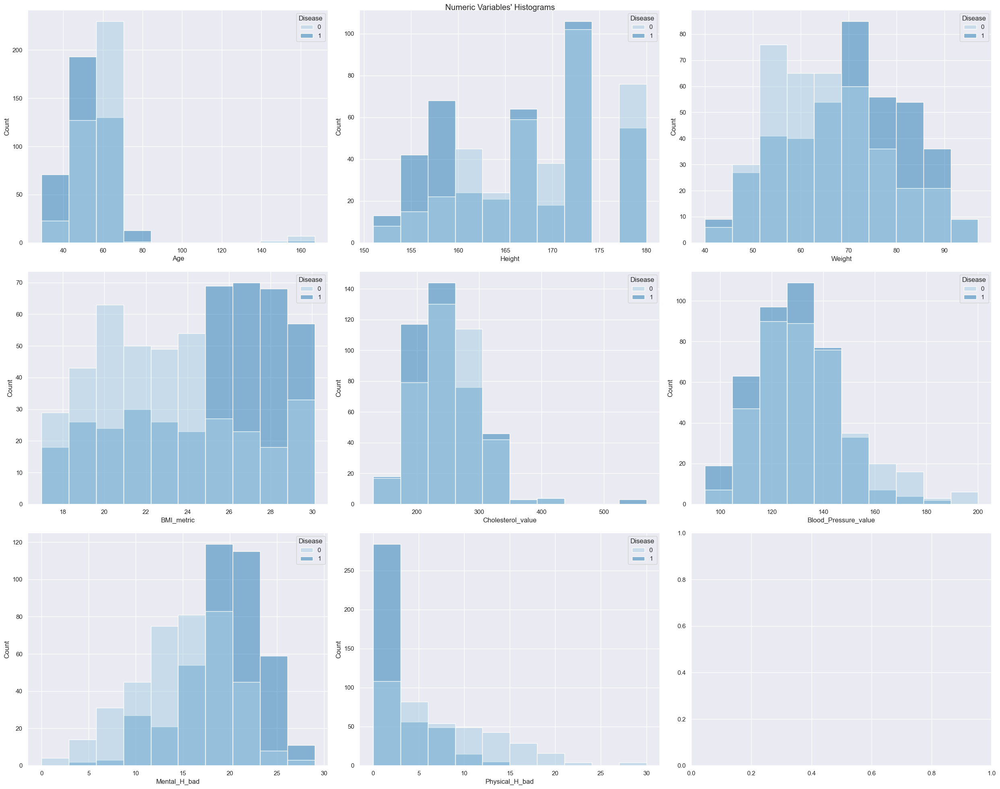

In [18]:
# Histograms of the Numeric Features
sns.set()
fig, axs = plt.subplots(3, ceil(len(metric_features) / 3), figsize=(25, 20))

for ax, bottom in zip(axs.flatten(), train_dataset[metric_features]):
    sns.histplot(ax=ax, data=train_dataset, x=bottom, hue ="Disease", bins = 10, palette = "Paired")
    
title = "Numeric Variables' Histograms"

plt.suptitle(title)
plt.tight_layout()
plt.show()

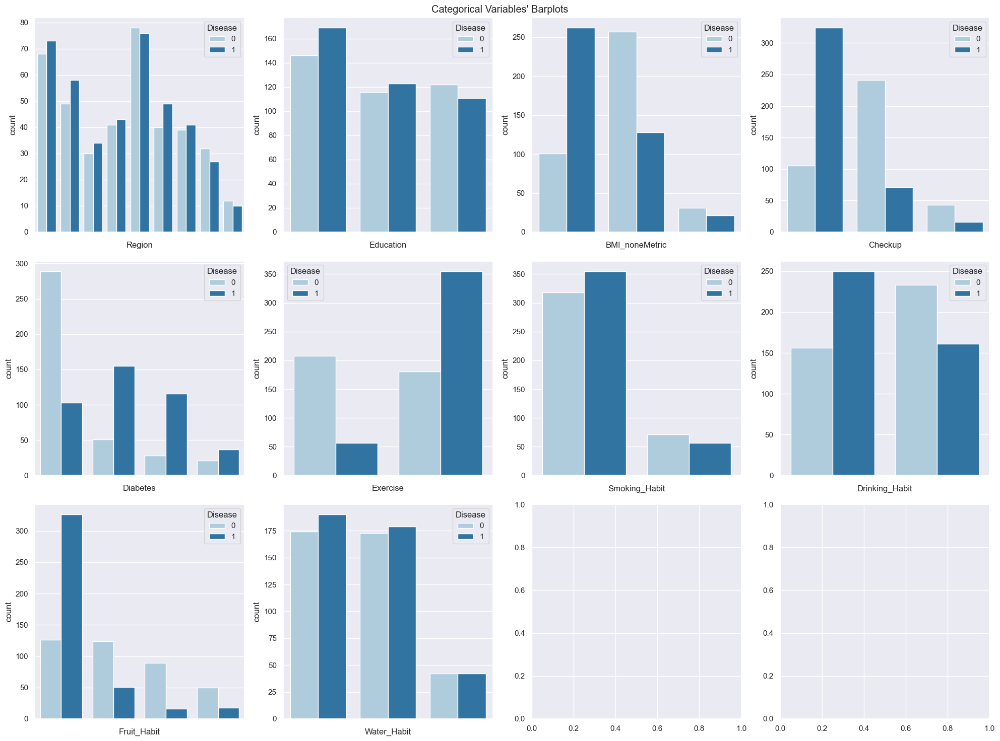

In [19]:
# Barplot of the Categorical Features
sns.set()
fig, axs = plt.subplots(3, ceil(len(n_metric_features) / 3), figsize=(20, 15))

for ax, bottom in zip(axs.flatten(), train_dataset[n_metric_features]):
    sns.countplot(ax=ax, data=train_dataset, x=train_dataset[bottom].astype(object), palette='Paired', hue = train_dataset["Disease"]).set(xticklabels=[])        

title = "Categorical Variables' Barplots"

plt.suptitle(title)
plt.tight_layout()
plt.show()

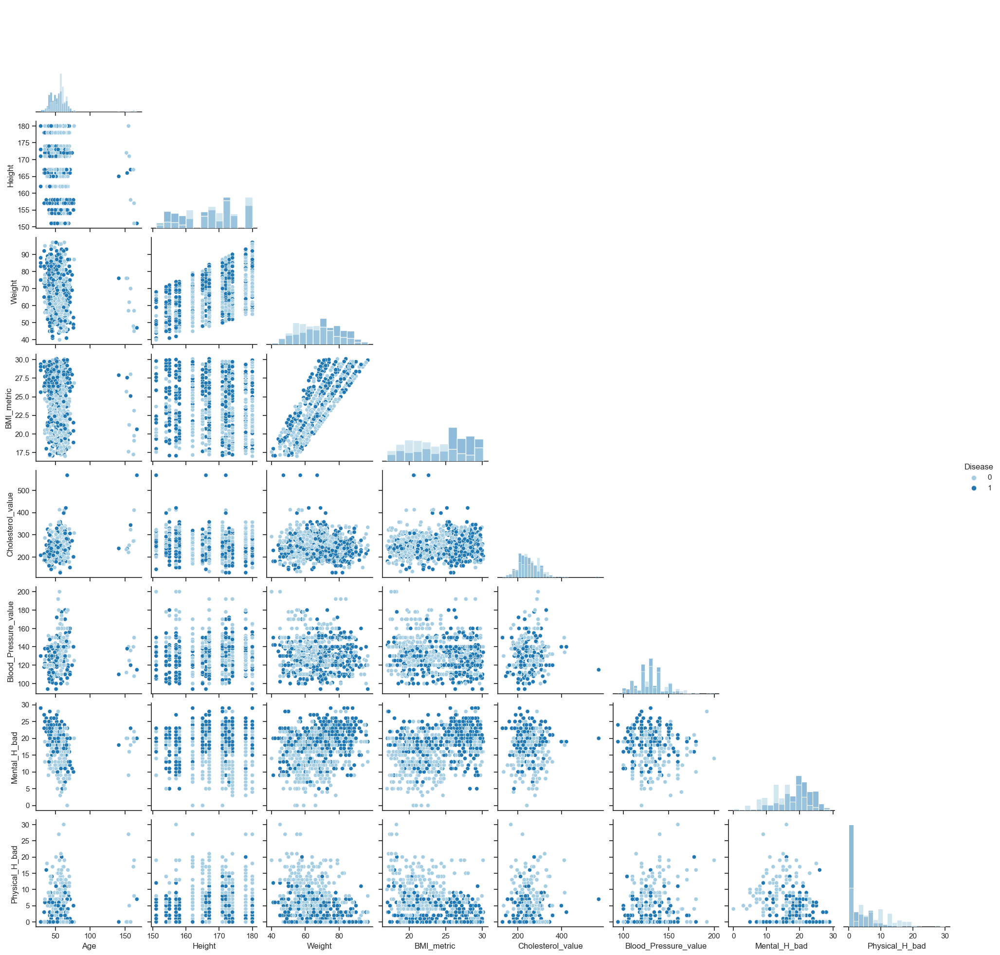

In [20]:
# Scatter Plot of how each pair of features behave towards the Target
sns.set_style("ticks")
sns.pairplot(train_dataset, hue = "Disease", diag_kind = "hist", kind = "scatter", palette = "Paired", corner = True)
plt.show()

<a class="anchor" id="OUTLIER.HANDLING">

# 4. Outlier Handling Solutions

</a>

<a class="anchor" id="OUTLIER.NUMERIC">

## 4.1 Numeric

</a>

In [21]:
# Descriptive statistics of the numerical features
train_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,800.0,55.956250,15.421872,29.000000,48.000000,56.000000,61.000000,167.000000
Height,800.0,167.806250,7.976888,151.000000,162.000000,167.000000,173.000000,180.000000
Weight,800.0,67.827500,12.113470,40.000000,58.000000,68.000000,77.000000,97.000000
BMI_metric,800.0,24.039237,3.658814,16.975309,20.830526,24.382545,27.147402,30.119402
Cholesterol_value,800.0,249.322500,51.566631,130.000000,213.750000,244.000000,280.000000,568.000000
Blood_Pressure_value,800.0,131.053750,17.052693,94.000000,120.000000,130.000000,140.000000,200.000000
Mental_H_bad,800.0,17.345000,5.385139,0.000000,13.000000,18.000000,21.000000,29.000000
Physical_H_bad,800.0,4.558750,5.449189,0.000000,0.000000,3.000000,7.000000,30.000000
Disease,800.0,0.513750,0.500124,0.000000,0.000000,1.000000,1.000000,1.000000


In [22]:
# List of numeric features
metric_features = train_dataset.describe().columns.drop("Disease").to_list()
metric_features

['Age',
 'Height',
 'Weight',
 'BMI_metric',
 'Cholesterol_value',
 'Blood_Pressure_value',
 'Mental_H_bad',
 'Physical_H_bad']

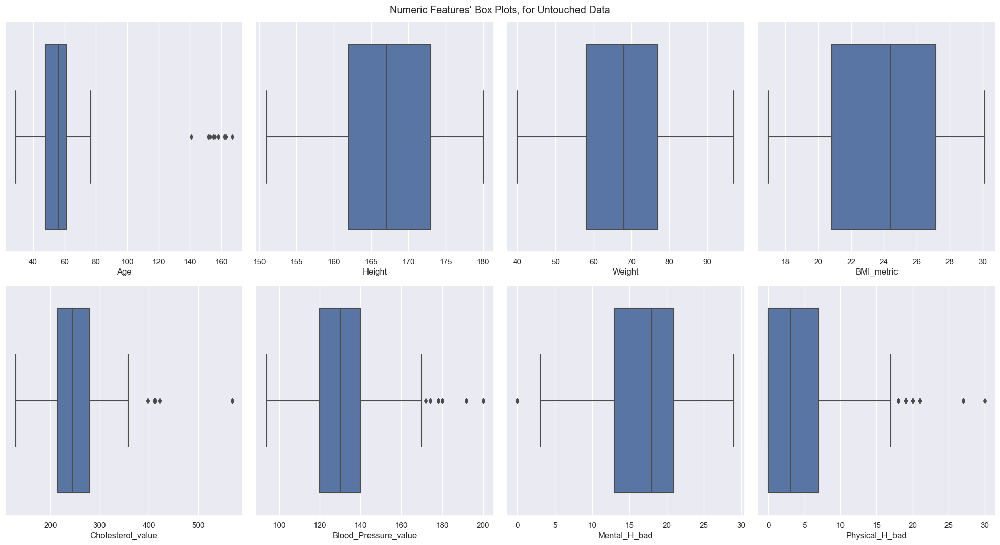

In [23]:
# Box Plots of the numerical features
sns.set()
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=train_dataset[feat], ax=ax)
    
title = "Numeric Features' Box Plots, for Untouched Data"

plt.suptitle(title)
plt.tight_layout()
plt.show()

In [24]:
# Looking at outliers
print('Age has', train_dataset[train_dataset["Age"] > 100].shape[0], 'data points over 100, ', train_dataset[train_dataset["Age"] > 100].shape[0]/len(train_dataset)*100, '% of the dataset.')
print('Cholesterol_value has', train_dataset[train_dataset["Cholesterol_value"] > 380].shape[0], 'data points over 380, ', train_dataset[train_dataset["Cholesterol_value"] > 380].shape[0]/len(train_dataset)*100, '% of the dataset.')
print('Blood_Pressure_value has', train_dataset[train_dataset["Blood_Pressure_value"] > 180].shape[0], 'data points over 180, ', train_dataset[train_dataset["Blood_Pressure_value"] > 180].shape[0]/len(train_dataset)*100, '% of the dataset.')

Age has 12 data points over 100,  1.5 % of the dataset.
Cholesterol_value has 11 data points over 380,  1.375 % of the dataset.
Blood_Pressure_value has 6 data points over 180,  0.75 % of the dataset.


In [25]:
# Outlier handling Solution 1 - Substitute the extreme values, by a maximun value, on each feature

df_extreme = train_dataset.copy()

Age_t = df_extreme["Age"].copy()
Age_t.loc[Age_t>100] = 100
df_extreme["Age"] = Age_t

Cholesterol_value_t = df_extreme["Cholesterol_value"].copy()
Cholesterol_value_t.loc[Cholesterol_value_t>380] = 380
df_extreme["Cholesterol_value"] = Cholesterol_value_t

Blood_Pressure_value_t = df_extreme["Blood_Pressure_value"].copy()
Blood_Pressure_value_t.loc[Blood_Pressure_value_t>180] = 180
df_extreme["Blood_Pressure_value"] = Blood_Pressure_value_t

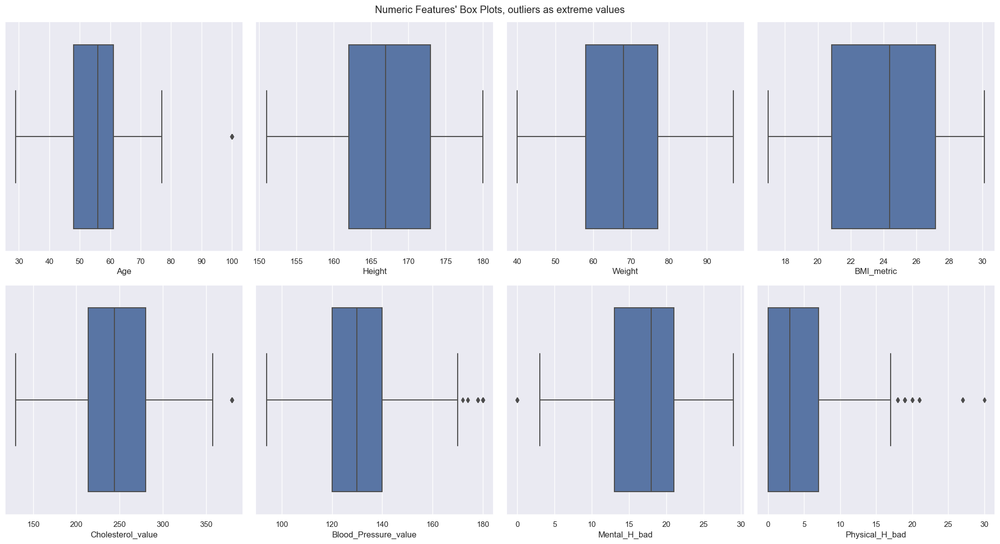

In [26]:
# Boxplot of Solution 1
sns.set()

# Prepare figure
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))
# Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_extreme[feat], ax=ax)
    
# Layout
title = "Numeric Features' Box Plots, outliers as extreme values"

plt.suptitle(title)
plt.tight_layout()
plt.show()

In [27]:
# Outlier handling Solution 2 - Drop outliers, "manually"

# Let's start by "manually" filtering the dataset's outliers

filters1 = (
    (train_dataset["Age"]<100)
    &
    (train_dataset["Cholesterol_value"]<380)  
    &
    (train_dataset["Blood_Pressure_value"]<180)
)

df_manual = train_dataset[filters1]

print('Percentage of data kept after removing outliers:', np.round(df_manual.shape[0] / train_dataset.shape[0]*100, 4), '%')

Percentage of data kept after removing outliers: 96.0 %


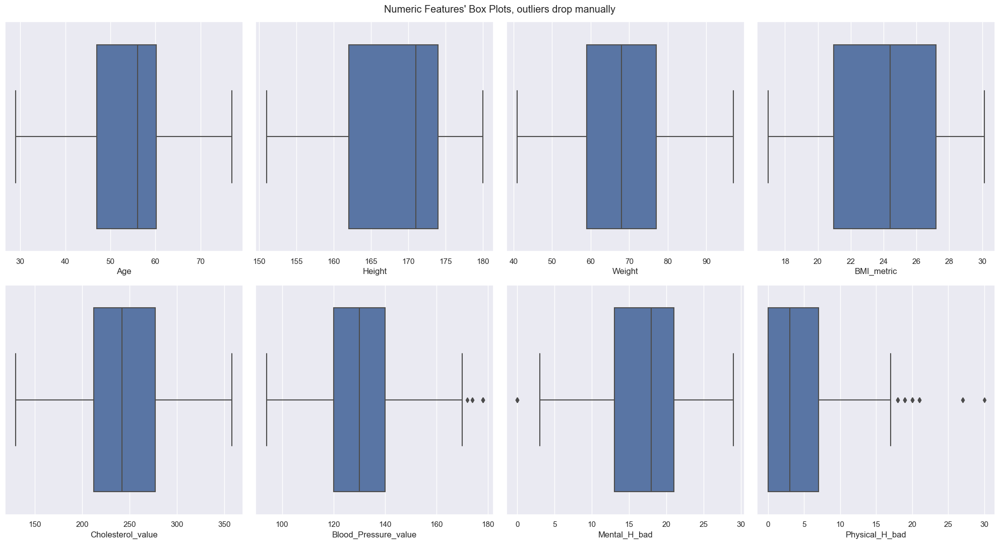

In [28]:
# Boxplot of Solution 2
sns.set()

# Prepare figure
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))
# Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_manual[feat], ax=ax)
    
# Layout
title = "Numeric Features' Box Plots, outliers drop manually"

plt.suptitle(title)
plt.tight_layout()
plt.show()

In [29]:
# Outlier handling Solution 3 - Outlier removal using the IQR method

q25 = train_dataset[metric_features].quantile(.25)
q75 = train_dataset[metric_features].quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 1.5 * iqr
lower_lim = q25 - 1.5 * iqr

filters2 = []
for metric in metric_features:
    llim = lower_lim[metric]
    ulim = upper_lim[metric]
    filters2.append(train_dataset[metric].between(llim, ulim, inclusive='both'))

filters2 = pd.Series(np.all(filters2, 0))
df_iqr = train_dataset[filters2.values]
print('Percentage of data kept after removing outliers:', np.round(df_iqr.shape[0] / train_dataset.shape[0]*100, 4),'%')

Percentage of data kept after removing outliers: 92.25 %


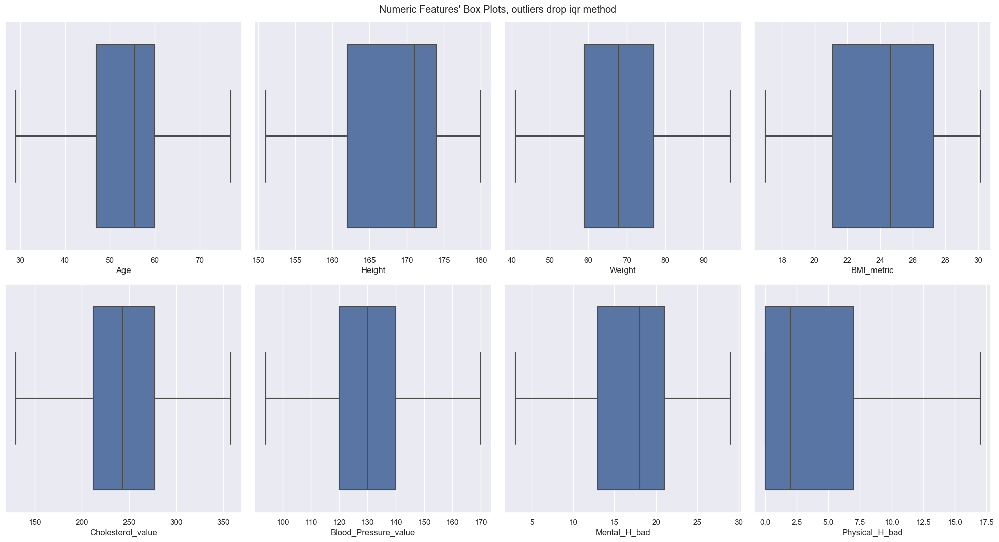

In [30]:
# Boxplot of Solution 3
sns.set()

# Prepare figure
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))
# Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_iqr[feat], ax=ax)
    
# Layout
title = "Numeric Features' Box Plots, outliers drop iqr method"

plt.suptitle(title)
plt.tight_layout()
plt.show()

In [31]:
# Outlier handling Solution 4 - Mix solution 2 (Drop outliers, "manually") with solution 3 (IQR method):

df_mix = train_dataset[(filters1 | filters2)]
print('Percentage of data kept after removing outliers:', np.round(df_mix.shape[0] / train_dataset.shape[0]*100, 4),'%')

Percentage of data kept after removing outliers: 96.0 %


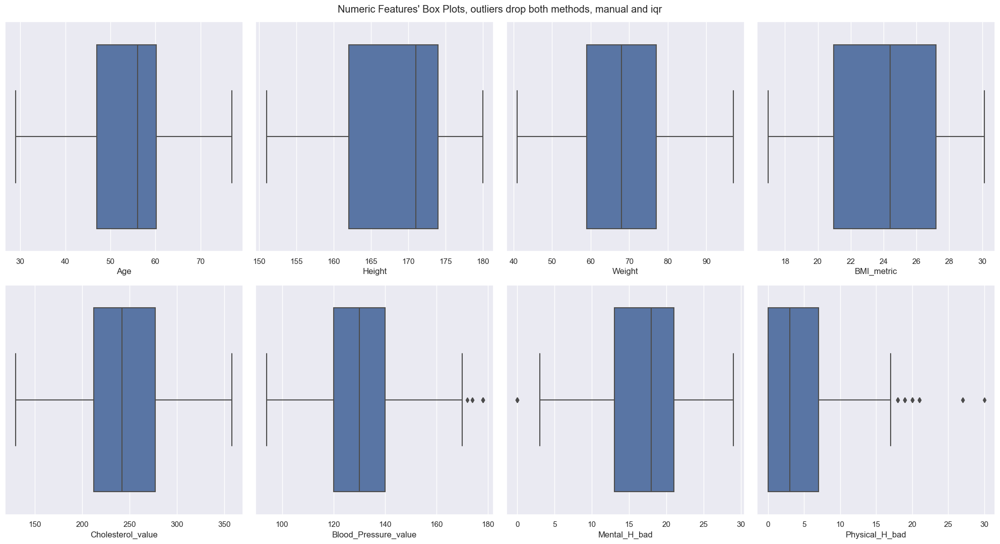

In [32]:
# Bloxplot of Solution 4
sns.set()

# Prepare figure
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))
# Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=df_mix[feat], ax=ax)
    
# Layout
title = "Numeric Features' Box Plots, outliers drop both methods, manual and iqr"

plt.suptitle(title)
plt.tight_layout()
plt.show()

<div class="alert alert-block alert-info">
Depending on the solution we are testing to handle outliers we can copy the df in question using the list above as a guide.
</div>

<a class="anchor" id="NUMERIC.SOLUTION">

### 4.1.1 Applying Outlier Solution

</a>

In [33]:
# Solution 1 is to be used
train_dataset = df_extreme.copy()
train_dataset.shape

(800, 19)

<a class="anchor" id="OUTLIER.CATEGORIC">

## 4.2 Categoric

</a>

In [34]:
# Describe Categorical features
train_dataset.describe(include = ['O']).T

,count,unique,top,freq
Region,800,9,East midlands,154
Education,787,3,0,315
BMI_noneMetric,800,3,Normal,385
Checkup,800,3,1,429
Diabetes,800,4,0,392
Exercise,800,2,No,536
Smoking_Habit,800,2,No,673
Drinking_Habit,800,2,Yes,406
Fruit_Habit,800,4,0,452
Water_Habit,800,3,2,364


In [35]:
# List of categorical features
n_metric_features = train_dataset.describe(include = ['O']).columns.to_list()
n_metric_features

['Region',
 'Education',
 'BMI_noneMetric',
 'Checkup',
 'Diabetes',
 'Exercise',
 'Smoking_Habit',
 'Drinking_Habit',
 'Fruit_Habit',
 'Water_Habit']

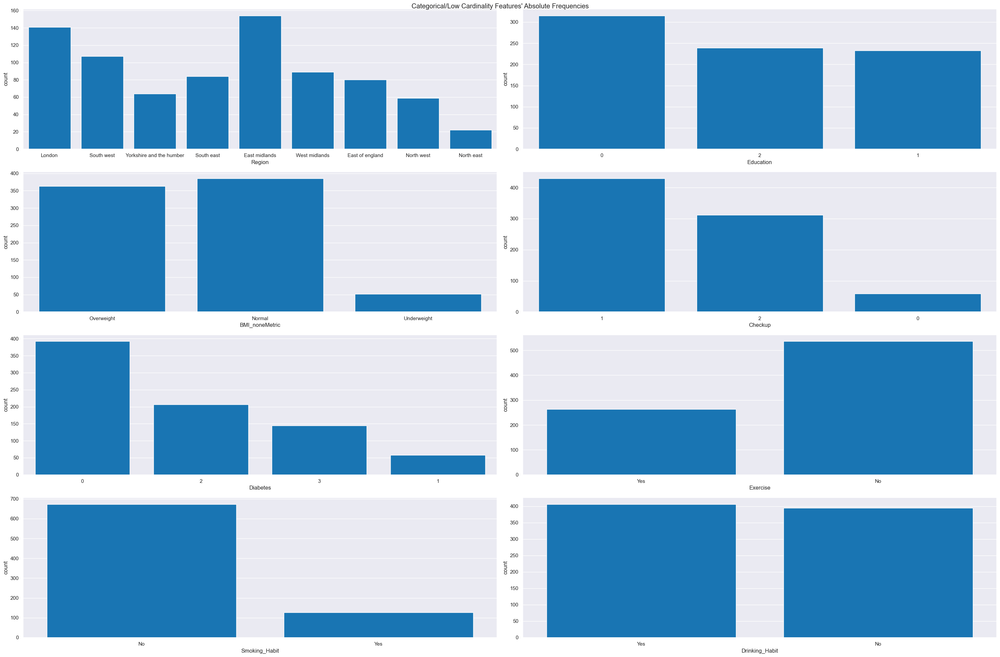

In [36]:
# Absolute Frequencies of the categoric features
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(4, ceil(len(n_metric_features)/6), figsize=(30, 20))

# Plot data
# Iterate across axes objects and associate each bar plot
for ax, feat in zip(axes.flatten(), n_metric_features):
    sns.countplot(x=train_dataset[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Features' Absolute Frequencies"
plt.suptitle(title)
plt.tight_layout()
plt.show()

<a class="anchor" id="FEATURE.SELECTION">

# 5 Feature Selection

</a>

In [37]:
# Data split into dependent and independent variables, (outliers dealt with here)
X = train_dataset.drop("Disease", axis = 1)
y = train_dataset["Disease"]

In [38]:
# Target variable "Disease" value counts
print(train_dataset["Disease"].value_counts())
print(train_dataset["Disease"].value_counts(normalize = True))

1    411
0    389
Name: Disease, dtype: int64
1    0.51375
0    0.48625
Name: Disease, dtype: float64


In [39]:
# By using the method train_test_split() from sklearn.model_selection, we split your dataset into train(80%) and validation(20%).
# A simple train test split is applied here to handle missing data and to scale
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = 0.2, random_state = 1, stratify = y, shuffle = True)

In [40]:
y_train.value_counts(normalize = True)

1    0.514062
0    0.485938
Name: Disease, dtype: float64

In [41]:
y_val.value_counts(normalize = True)

1    0.5125
0    0.4875
Name: Disease, dtype: float64

<a class="anchor" id="NUMERIC.SELECTION">

## 5.1 Numeric

</a>

<a class="anchor" id="NUMERIC.MISSINGVALUES">

### 5.1.1 Handling Missing Values

</a>

In [42]:
# Function to handle missing values
def hdl_missing_values(X_train,X_val):
    """
    Function that takes 2 dataframes, X_train, X_val as arguments.
    It fills the missing values of both the training and validation data with the mode of the feature 
    that has missing values. The mode that fills both dataframes is extracted from the training dataset.
    """
    
    # Create a list with the indexes of the rows that contain missing values in X_train and X_val
    nans_index = X_train.isna().any(axis=1)
    nans_index_val = X_val.isna().any(axis=1)
    
    # Add the mode of each categorical feature to the variable modes. The mode used was extracted from X_train
    modes = X_train.mode().loc[0]
    
    # Fill the missing values of both X_train and X_val with the mode of X_train
    X_train.fillna(modes, inplace=True)
    X_val.fillna(modes, inplace=True)
    
    return X_train, X_val

In [43]:
# Call the function hdl_missing_values to handle the missing values
X_train, X_val = hdl_missing_values(X_train, X_val)

In [44]:
# Confirm the effect of the function hdl_missing_values on X_train and X_val
print(X_train.isnull().sum())
print(X_val.isnull().sum())

Age                     0
Region                  0
Education               0
Height                  0
Weight                  0
BMI_metric              0
BMI_noneMetric          0
Checkup                 0
Diabetes                0
Cholesterol_value       0
Blood_Pressure_value    0
Mental_H_bad            0
Physical_H_bad          0
Exercise                0
Smoking_Habit           0
Drinking_Habit          0
Fruit_Habit             0
Water_Habit             0
dtype: int64
Age                     0
Region                  0
Education               0
Height                  0
Weight                  0
BMI_metric              0
BMI_noneMetric          0
Checkup                 0
Diabetes                0
Cholesterol_value       0
Blood_Pressure_value    0
Mental_H_bad            0
Physical_H_bad          0
Exercise                0
Smoking_Habit           0
Drinking_Habit          0
Fruit_Habit             0
Water_Habit             0
dtype: int64


<a class="anchor" id="FEATURE.SCALING">

### 5.1.2 Feature Scaling

</a>

In [45]:
# Different types of scalers
# MinMax Scalers
min_max_1 = MinMaxScaler()
min_max_2 = MinMaxScaler(feature_range = (-1,1))

# Standard Scaler
standard_scaler = StandardScaler()

# Robust Scaler
robust_scaler = RobustScaler()


# List of scalers in case later on we use grip search
scalers = [min_max_1, min_max_2, standard_scaler, robust_scaler]

In [46]:
# Function to add type of scaler used in X_train and X_val
def scaling(X_train, X_val, scaler):
    """
    Function that takes 2 dataframes, X_train, X_val and a type of scaler as arguments.
    It separetes both dataframes into 2 separate numeric and categoric features (X_train_num, X_train_cat, X_val_num, X_val_cat).
    Creates a scaling method.
    Scales X_train_num and X_val_num.
    Joins the respective numeric and categoric dataframes into a single one.
    Returns the given 2 dataframes with its numeric features scaled and it retuns a scaler object to be used in the test
    """
    # Separate X_train in numeric and categoric features
    X_train_num = X_train.select_dtypes(include=np.number).set_index(X_train.index)
    X_train_cat = X_train.select_dtypes(exclude=np.number).set_index(X_train.index)

    # Separate X_val in numeric and categoric features
    X_val_num = X_val.select_dtypes(include=np.number).set_index(X_val.index)
    X_val_cat = X_val.select_dtypes(exclude=np.number).set_index(X_val.index)

    # Create a scaling method        
    scaler = scaler.fit(X_train_num)

    # Scaling the X_train_num
    X_train_num_scaled = scaler.transform(X_train_num) 
    X_train_num_scaled = pd.DataFrame(X_train_num_scaled, columns = X_train_num.columns).set_index(X_train_num.index)

    # Scaling the X_val_num
    X_val_num_scaled = scaler.transform(X_val_num) 
    X_val_num_scaled = pd.DataFrame(X_val_num_scaled, columns = X_val_num.columns).set_index(X_val_num.index)


    # Join the numeric and categoric features of X_train and X_val back together
    X_train = X_train_num_scaled.join(X_train_cat)
    X_val = X_val_num_scaled.join(X_val_cat)  
    
    # return
    return X_train, X_val, scaler

In [47]:
# Call function scaling() to scale X_train and X_val and specify what scaler is to be used
X_train_scaled, X_val_scaled, scaler_hot_enc = scaling(X_train, X_val, min_max_1)

In [48]:
# # Describe the scaled data to see if the function worked
X_train_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,640.0,0.366989,0.147370,0.0,0.253521,0.380282,0.450704,1.0
Height,640.0,0.594881,0.269876,0.0,0.379310,0.689655,0.793103,1.0
Weight,640.0,0.490241,0.210444,0.0,0.333333,0.491228,0.635965,1.0
BMI_metric,640.0,0.531248,0.277143,0.0,0.291408,0.555814,0.773559,1.0
Cholesterol_value,640.0,0.468125,0.187300,0.0,0.331000,0.452000,0.596000,1.0
Blood_Pressure_value,640.0,0.431032,0.192259,0.0,0.302326,0.418605,0.534884,1.0
Mental_H_bad,640.0,0.594073,0.183080,0.0,0.448276,0.620690,0.724138,1.0
Physical_H_bad,640.0,0.169387,0.194544,0.0,0.000000,0.111111,0.259259,1.0


In [49]:
X_val_scaled.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,160.0,0.369542,0.151015,0.000000,0.281690,0.387324,0.464789,1.000000
Height,160.0,0.518103,0.287671,0.000000,0.241379,0.551724,0.758621,1.000000
Weight,160.0,0.480044,0.221106,0.087719,0.280702,0.508772,0.653509,1.000000
BMI_metric,160.0,0.562120,0.282711,0.009432,0.321030,0.642786,0.804384,0.986220
Cholesterol_value,160.0,0.493700,0.198532,0.000000,0.340000,0.480000,0.621000,1.000000
Blood_Pressure_value,160.0,0.423183,0.198968,0.000000,0.302326,0.418605,0.534884,1.000000
Mental_H_bad,160.0,0.614224,0.195569,0.000000,0.508621,0.655172,0.758621,1.000000
Physical_H_bad,160.0,0.166667,0.229292,0.000000,0.000000,0.074074,0.259259,1.111111


In [50]:
# Splitting train and validation into numeric and categorical
X_train_num = X_train_scaled.select_dtypes(include=np.number).set_index(X_train_scaled.index)
X_train_cat = X_train_scaled.select_dtypes(exclude=np.number).set_index(X_train_scaled.index)

X_val_num = X_val_scaled.select_dtypes(include=np.number).set_index(X_val_scaled.index)
X_val_cat = X_val_scaled.select_dtypes(exclude=np.number).set_index(X_val_scaled.index)

### Univariate variables

<div class="alert alert-block alert-info">
Check if any of the numerical variables is univariate (variance is equal to 0). Drop those variables if existent.
</div>

In [51]:
X_train_scaled.var(numeric_only=True)

Age                     0.021718
Height                  0.072833
Weight                  0.044287
BMI_metric              0.076808
Cholesterol_value       0.035081
Blood_Pressure_value    0.036963
Mental_H_bad            0.033518
Physical_H_bad          0.037848
dtype: float64

<div class="alert alert-block alert-success">
We don't have any univariate variables.
</div>

### 
<a class="anchor" id="NUMERIC.CORRELATION">

### 5.1.3 Spearman Correlation

</a>

In [52]:
# Add the target variable to the scaled data to observe the correlation
X_y_train_scaled = X_train_scaled.join(y_train)
X_y_train_scaled.head()

,Age,Height,Weight,BMI_metric,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,Region,Education,BMI_noneMetric,Checkup,Diabetes,Exercise,Smoking_Habit,Drinking_Habit,Fruit_Habit,Water_Habit,Disease
PatientID,,,,,,,,,,,,,,,,,,,
1162,0.676056,1.000000,0.824561,0.751405,0.712,0.360465,0.689655,0.000000,South west,0,Overweight,1,0,Yes,No,No,3,1,0
1822,0.436620,0.758621,0.736842,0.792970,0.508,0.418605,0.551724,0.222222,East of england,2,Overweight,2,0,Yes,No,Yes,1,1,0
1320,0.338028,0.724138,0.315789,0.200081,0.552,0.418605,0.551724,0.037037,East midlands,0,Normal,1,0,No,No,No,0,1,1
1081,0.281690,0.724138,0.807018,0.920144,0.092,0.279070,0.413793,0.111111,East of england,0,Overweight,1,2,No,No,No,3,1,0
1336,0.394366,0.724138,0.631579,0.662979,0.000,0.651163,0.793103,0.000000,Yorkshire and the humber,1,Overweight,2,2,No,Yes,Yes,1,2,1


In [53]:
# Function to plot a heatmap of a correlation table
def cor_heatmap(cor):
    """
    Function that takes a correlation table cor as an argument.
    """
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.Blues, fmt='.1')
    plt.show()

In [54]:
# Spearman correlation table of the scaled numeric varibles and the target variable
cor_spearman = X_y_train_scaled.select_dtypes(include=np.number).set_index(X_train.index).corr(method ='spearman')
cor_spearman

,Age,Height,Weight,BMI_metric,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,Disease
Age,1.000000,-0.072190,-0.165334,-0.142293,0.212207,0.271689,-0.353816,0.220766,-0.202260
Height,-0.072190,1.000000,0.464564,-0.025627,-0.024138,-0.016740,-0.046898,0.054136,-0.171733
Weight,-0.165334,0.464564,1.000000,0.856198,0.004579,-0.082154,0.310331,-0.423502,0.161100
BMI_metric,-0.142293,-0.025627,0.856198,1.000000,0.034715,-0.103499,0.373842,-0.519933,0.291175
Cholesterol_value,0.212207,-0.024138,0.004579,0.034715,1.000000,0.159980,0.005589,0.024460,-0.109648
Blood_Pressure_value,0.271689,-0.016740,-0.082154,-0.103499,0.159980,1.000000,-0.031446,0.136655,-0.123526
Mental_H_bad,-0.353816,-0.046898,0.310331,0.373842,0.005589,-0.031446,1.000000,-0.403721,0.403526
Physical_H_bad,0.220766,0.054136,-0.423502,-0.519933,0.024460,0.136655,-0.403721,1.000000,-0.431233
Disease,-0.202260,-0.171733,0.161100,0.291175,-0.109648,-0.123526,0.403526,-0.431233,1.000000


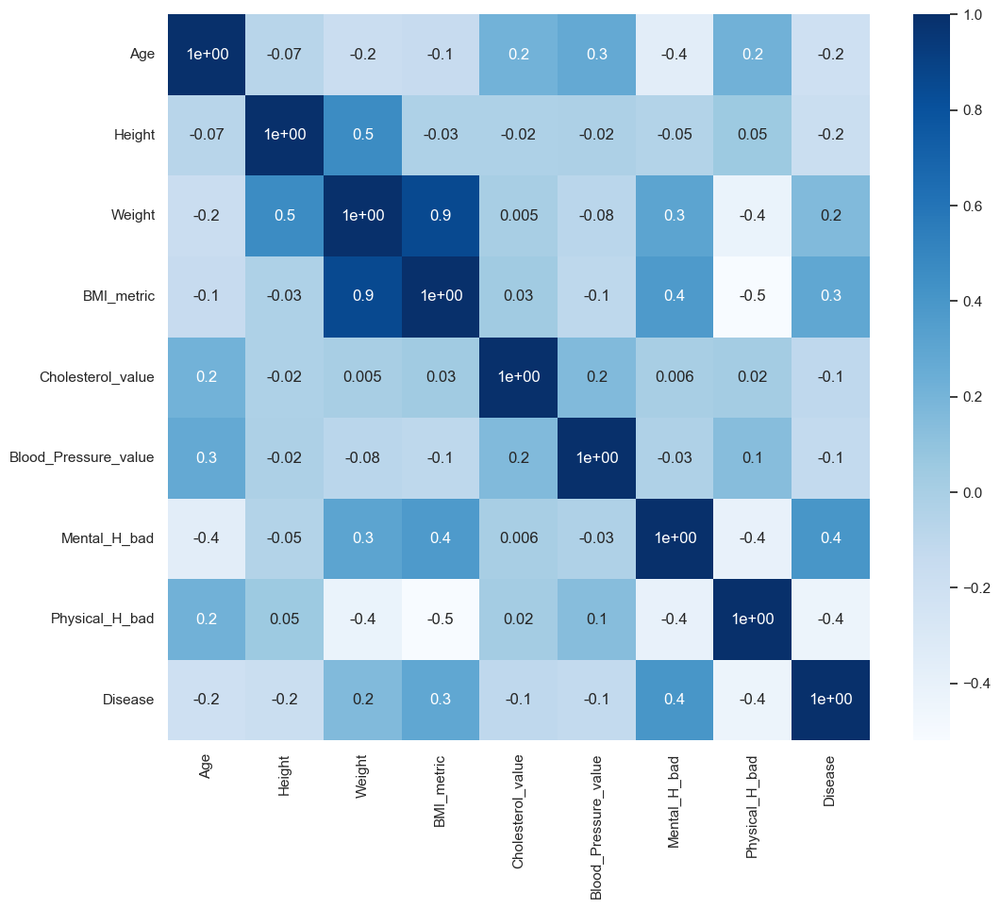

In [55]:
# Call the function cor_heatmap() to the correlation table cor_spearman
cor_heatmap(cor_spearman)

In [56]:
## THIS NEEDS TO GO TO THE REPORT
# Correlation >= 0.5

# ## Between features ###
#     ### positive ####
# BMI_metric vs Weight = 0.9
# Height vs Weight = 0.5
# BMI_metric vs Mental_H_bad = 0.4

#    ### negative ####
# BMI_metric vs Physical_H_bad = -0.5
# Age vs Mental_H_bad = -0.4   
# Weight vs Physical_H_bad = -0.4
# Mental_H_bad vs Physical_H_bad = -0.4

# ## Feature and target ###
#    ### positive ####
# Mental_H_bad vs Disease = 0.4

#    ### negative ####
# Physical_H_bad vs Disease = -0.4

# #### Conclusion #####
# There is no independent variable highly correlated with the target
# the higher are Mental_Health with 0.4, and BMI with 0.3

<div class="alert alert-block alert-success">
According to the Spearman correlation, there isn't a single feature that highly correlates with the target,
however it was observed that <b>"Weight"</b> and <b>"BMI_metric"</b> share a correlation value of <b>0.9</b>.<br>
Given that <b>"BMI_metric"</b> has a higher correlation towards the target, <b>"Weight"</b> should be discarded.
</div>

In [57]:
# List that stores the decision of keeping or discarding numeric features based on the spearman correlation matrix observation
Spearman = ['Keep', 'Keep', 'Discard', 'Keep', 'Keep', 'Keep', 'Keep', 'Keep']

<a class="anchor" id="NUMERIC.SELECTION.METHODS">

### 5.1.4 Wrapper Methods

</a>

Recursive Feature Elimination (RFE / Backwards)

<div class="alert alert-block alert-info">
Recursive Feature Elimination (RFE / Backwards) will identify the most important features to keep. 
    The base estimator used will be a <b>Logistic Regression</b>.
</div>

In [58]:
# RFE

#Check how many variables are important
#number of features
nof_list=list(range(1,9))
high_score=0
#Variable to store the optimum features
nof=0           
score_list =[]
for n in nof_list:
    model = LogisticRegression()
    rfe_1 = RFE(estimator = model, n_features_to_select = n)
    X_train_rfe = rfe_1.fit_transform(X_train_num,y_train)
    X_val_rfe = rfe_1.transform(X_val_num)
    model.fit(X_train_rfe,y_train)
    
    score = model.score(X_val_rfe,y_val)
    score_list.append(score)
    
    if(score>high_score):
        high_score = score
        nof = nof_list[n]
print("Optimum number of features: %d" %nof)
print("Score with %d features: %f" % (nof, high_score))

Optimum number of features: 6
Score with 6 features: 0.768750


In [59]:
# These are the most important features
rfe = RFE(estimator = model, n_features_to_select = 6)
X_rfe = rfe.fit_transform(X = X_train_num, y = y_train)
selected_features = pd.Series(rfe.support_, index = X_train_num.columns)
selected_features

Age                      True
Height                   True
Weight                  False
BMI_metric              False
Cholesterol_value        True
Blood_Pressure_value     True
Mental_H_bad             True
Physical_H_bad           True
dtype: bool

In [60]:
# List that stores the decision of keeping or discarding numeric features based on RFE
RFE = ['Keep', 'Keep', 'Discard', 'Discard', 'Keep', 'Keep', 'Keep', 'Keep']

Lasso Regression and Decision Tree

<div class="alert alert-block alert-info">
Lasso regression is a type of linear regression that uses shrinkage. Shrinkage is where data values are shrunk towards a central point, like the mean.
</div>

In [61]:
# Lasso
def plot_importance(coef,name):
    imp_coef = coef.sort_values()
    plt.figure(figsize=(8,10))
    imp_coef.plot(kind = "barh")
    plt.title("Feature importance using " + name + " Model")
    plt.show()
    
# Using LassoCV, create a Lasso Regression instance called reg
reg = LassoCV()

# Fit the data to reg by using the method fit() where X should be assigned to data and y to the dependent variable
reg.fit(X_train_num, y_train)

# Create an object (pandas Series) named coef that will have as index the data columns names and the coef_ attribute as value
coef = pd.Series(reg.coef_, index = X_train_num.columns)
coef

Age                    -0.038053
Height                 -0.301340
Weight                 -0.000000
BMI_metric              0.057059
Cholesterol_value      -0.228985
Blood_Pressure_value   -0.172127
Mental_H_bad            0.749741
Physical_H_bad         -0.771156
dtype: float64

In [62]:
# List that stores the decision of keeping or discarding numeric features based on Lasso regression
lasso = ['Keep', 'Keep', 'Discard', 'Keep', 'Keep', 'Keep', 'Keep', 'Keep']

Decision Trees (Entropy & Gini)

<AxesSubplot:xlabel='Value', ylabel='Col'>

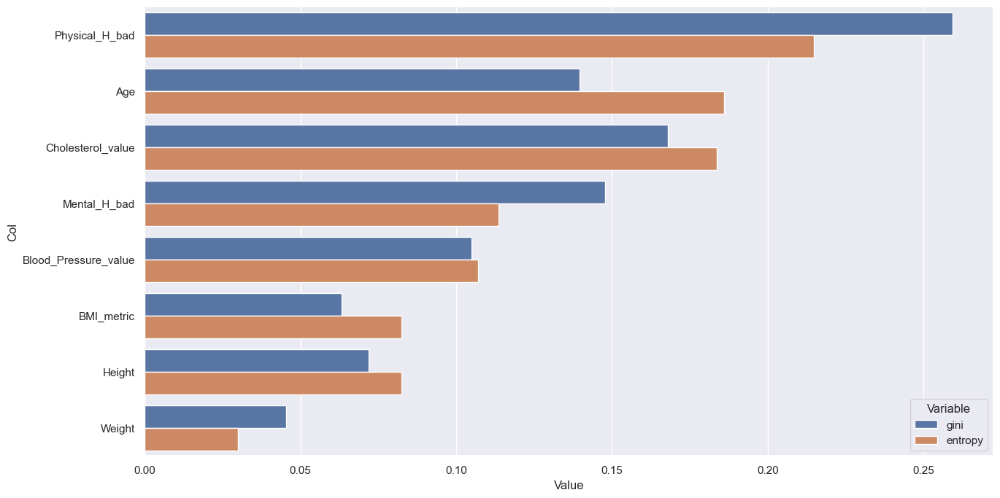

In [63]:
# Decision Trees
X_train_num_ = X_train.select_dtypes(include=np.number).set_index(X_train.index)
X_val_num_ = X_val.select_dtypes(include=np.number).set_index(X_val.index)

gini_importance = DecisionTreeClassifier().fit(X_train_num_, y_train).feature_importances_
entropy_importance = DecisionTreeClassifier(criterion='entropy').fit(X_train_num_, y_train).feature_importances_


zippy = pd.DataFrame(zip(gini_importance, entropy_importance), columns = ['gini','entropy'])
zippy['col'] = X_train_num.columns
tidy = zippy.melt(id_vars='col').rename(columns=str.title)
tidy.sort_values(['Value'], ascending = False, inplace = True)

plt.figure(figsize=(15,8))
sns.barplot(y='Col', x='Value', hue='Variable', data=tidy)

In [64]:
# List that stores the decision of keeping or discarding numeric features based on Decision trees
DT = ['Keep', 'Discard', 'Discard', 'Discard', 'Keep', 'Keep', 'Keep', 'Keep']

<a class="anchor" id="NUMERIC.SELECTION.DECISION">

### 5.1.5 Decision

</a>

In [65]:
# Dataframe that includes all the decions regarding the feauture selection of numeric variables
df_metric = pd.DataFrame(list(zip(Spearman, RFE, lasso, DT)), 
                  index = [metric_features],
                 columns =['Spearman', 'RFE', 'Lasso', 'DT'])


# Function to set True if all items are the same of each feature
def chkList(lst):
    return len(set(lst)) == 1

final_decision= []
for n in range(0,8):
    validation = []
    for item in df_metric:
        validation.append(df_metric[item][n])
    if chkList(validation) == True:
        final_decision.append(validation[0])
    else:
        final_decision.append('Try with and without')
        
df_metric["Final Decision"] = final_decision
df_metric

,Spearman,RFE,Lasso,DT,Final Decision
Age,Keep,Keep,Keep,Keep,Keep
Height,Keep,Keep,Keep,Discard,Try with and without
Weight,Discard,Discard,Discard,Discard,Discard
BMI_metric,Keep,Discard,Keep,Discard,Try with and without
Cholesterol_value,Keep,Keep,Keep,Keep,Keep
Blood_Pressure_value,Keep,Keep,Keep,Keep,Keep
Mental_H_bad,Keep,Keep,Keep,Keep,Keep
Physical_H_bad,Keep,Keep,Keep,Keep,Keep


<div class="alert alert-block alert-success">
    <b>"Height"</b>, <b>"Weight"</b> and <b>"BMI_metric"</b> will be discarded.   
</div>

<a class="anchor" id="CATEGORIC.SELECTION">

## 5.2 Categoric

</a>

<a class="anchor" id="CATEGORIC.CHI">

### 5.2.1 Chi-Square Test

</a>

<div class="alert alert-block alert-info">
    A Chi-square test is a hypothesis testing method. This will check the importance of the categoric features towards the target.
</div>

In [66]:
# Function to perform chi-square 

def TestIndependence(X,y,var,alpha=0.05):
    '''
    This function takes as arguments a dataset of independent variables, the target, the name of each variable on the first dataframe and an alpha.
    It will follow the steps of chi-square to check if independent variables are important predictors of the target.
    '''
    dfObserved = pd.crosstab(y,X) 
    chi2, p, dof, expected = stats.chi2_contingency(dfObserved.values)
    dfExpected = pd.DataFrame(expected, columns=dfObserved.columns, index = dfObserved.index)
    if p<alpha:
        result="{0} is IMPORTANT for Prediction".format(var)
    else:
        result="{0} is NOT an important predictor. (Discard {0} from model)".format(var)
    print(result)

In [67]:
# Given that the previously created function only works in one variable at a time, a loop was created to go through all the features
for var in X_train_cat:
    TestIndependence(X_train_cat[var],y_train, var)

Region is NOT an important predictor. (Discard Region from model)
Education is NOT an important predictor. (Discard Education from model)
BMI_noneMetric is IMPORTANT for Prediction
Checkup is IMPORTANT for Prediction
Diabetes is IMPORTANT for Prediction
Exercise is IMPORTANT for Prediction
Smoking_Habit is NOT an important predictor. (Discard Smoking_Habit from model)
Drinking_Habit is IMPORTANT for Prediction
Fruit_Habit is IMPORTANT for Prediction
Water_Habit is NOT an important predictor. (Discard Water_Habit from model)


 <a class="anchor" id="CATEGORIC.DECISION">

### 5.2.2 Decision

</a>

<div class="alert alert-block alert-success">
According to the Chi-square Test, the following features are not important: <b>"Region"</b>, <b>"Education"</b>, <b>"Smoking_Habit"</b> and <b>"Water_Habit"</b>.
</div>

<a class="anchor" id="RELEVANT.FEATURES">

## 5.3 Selecting Relevant Features

</a>

In [68]:
# Set dataset with the main variables
X_train_num = X_train_num.drop(["Height","Weight", "BMI_metric"], axis = 1)
X_val_num = X_val_num.drop(["Height","Weight", "BMI_metric"], axis = 1)

X_train_cat = X_train_cat .drop(["Region", "Education", "Water_Habit", "Smoking_Habit"], axis = 1)
X_val_cat = X_val_cat.drop(["Region", "Education", "Water_Habit", "Smoking_Habit"], axis = 1)


metric_features = [e for e in metric_features if e not in ("Height","Weight", "BMI_metric")]
n_metric_features = [e for e in n_metric_features if e not in ("Region", "Education", "Water_Habit")]

# If we decide to work with all variables:
# df_clean = train_dataset

In [69]:
# Join train and validation in case Kfold is to be applied
X_train_num_ws = X_train.select_dtypes(include=np.number).set_index(X_train_scaled.index)
X_val_num_ws = X_val.select_dtypes(include=np.number).set_index(X_val_scaled.index)

# Contact val and training for kfold
X_num = pd.concat([X_train_num, X_val_num])
X_cat = pd.concat([X_train_cat, X_val_cat])

<a class="anchor" id="FEATURE.ENCODING">

# 6 Feature Encoding

</a>

In [70]:
# Encoding categorical variables with OneHotEncoder
# Encoding the train datasset
ohc = OneHotEncoder(sparse=False, drop='first')
ohc_feat = ohc.fit_transform(X_train_cat)
ohc_feat_names = ohc.get_feature_names_out()
ohc_feat_names
ohc_df_train = pd.DataFrame(ohc_feat, index=X_train_cat.index, columns=ohc_feat_names) 
ohc_df_train

,BMI_noneMetric_Overweight,BMI_noneMetric_Underweight,Checkup_1,Checkup_2,Diabetes_1,Diabetes_2,Diabetes_3,Exercise_Yes,Drinking_Habit_Yes,Fruit_Habit_1,Fruit_Habit_2,Fruit_Habit_3
PatientID,,,,,,,,,,,,
1162,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
1822,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0
1320,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1081,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1336,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1088,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1395,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0
1836,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [71]:
# Joining the scaled and encoded feautures and adding them back to X_train
X_train = X_train_num.join(ohc_df_train, how='outer')
X_train.head(1)

,Age,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,BMI_noneMetric_Overweight,BMI_noneMetric_Underweight,Checkup_1,Checkup_2,Diabetes_1,Diabetes_2,Diabetes_3,Exercise_Yes,Drinking_Habit_Yes,Fruit_Habit_1,Fruit_Habit_2,Fruit_Habit_3
PatientID,,,,,,,,,,,,,,,,,
1162,0.676056,0.712,0.360465,0.689655,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [72]:
# Rename the categoric features of the train dataset, so that they start with 'c_'

# Assemble OHE columns and their new column names
rename_ohe_cols = {}

for i in n_metric_features:
    for j in X_train.columns[X_train.columns.str.startswith(i)].to_list() :
        rename_ohe_cols[j] = 'c_' + j

X_train.rename(columns=rename_ohe_cols, inplace=True)

In [73]:
X_train.head(1)

,Age,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,c_BMI_noneMetric_Overweight,c_BMI_noneMetric_Underweight,c_Checkup_1,c_Checkup_2,c_Diabetes_1,c_Diabetes_2,c_Diabetes_3,c_Exercise_Yes,c_Drinking_Habit_Yes,c_Fruit_Habit_1,c_Fruit_Habit_2,c_Fruit_Habit_3
PatientID,,,,,,,,,,,,,,,,,
1162,0.676056,0.712,0.360465,0.689655,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [74]:
# Encoding the validation dataset
ohc = OneHotEncoder(sparse=False, drop='first')
ohc_feat = ohc.fit_transform(X_val_cat)
ohc_feat_names = ohc.get_feature_names_out()
ohc_feat_names
ohc_df_val = pd.DataFrame(ohc_feat, index=X_val_cat.index, columns=ohc_feat_names) 
ohc_df_val.head(1)

,BMI_noneMetric_Overweight,BMI_noneMetric_Underweight,Checkup_1,Checkup_2,Diabetes_1,Diabetes_2,Diabetes_3,Exercise_Yes,Drinking_Habit_Yes,Fruit_Habit_1,Fruit_Habit_2,Fruit_Habit_3
PatientID,,,,,,,,,,,,
1295,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [75]:
# Reassigning the validation dataset
X_val = X_val_num.join(ohc_df_val, how='outer')
X_val.head(1)

,Age,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,BMI_noneMetric_Overweight,BMI_noneMetric_Underweight,Checkup_1,Checkup_2,Diabetes_1,Diabetes_2,Diabetes_3,Exercise_Yes,Drinking_Habit_Yes,Fruit_Habit_1,Fruit_Habit_2,Fruit_Habit_3
PatientID,,,,,,,,,,,,,,,,,
1295,0.535211,0.692,0.069767,0.413793,0.148148,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [76]:
# Rename the categoric features of the validation dataset, so that they start with 'c_'

# Assemble OHE columns and their new column names
rename_ohe_cols = {}

for i in n_metric_features:
    for j in X_val.columns[X_val.columns.str.startswith(i)].to_list() :
        rename_ohe_cols[j] = 'c_' + j

X_val.rename(columns=rename_ohe_cols, inplace=True)

X_val.head(1)

,Age,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,c_BMI_noneMetric_Overweight,c_BMI_noneMetric_Underweight,c_Checkup_1,c_Checkup_2,c_Diabetes_1,c_Diabetes_2,c_Diabetes_3,c_Exercise_Yes,c_Drinking_Habit_Yes,c_Fruit_Habit_1,c_Fruit_Habit_2,c_Fruit_Habit_3
PatientID,,,,,,,,,,,,,,,,,
1295,0.535211,0.692,0.069767,0.413793,0.148148,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [78]:
print(X_train.shape)
print(X_val.shape)
print(y_train.shape)
print(y_val.shape)

(640, 17)
(160, 17)
(640,)
(160,)


In [79]:
# Join train and val so it later can be used with kFold
X = pd.concat([X_train,X_val])
y = pd.concat([y_train,y_val])

In [80]:
# Export CSVs of clean data

#X_train.to_csv(r'/Users/pedroanastacio/Desktop/University/2022/MachineLearning22/Project/X_train.csv', index=True)
#X_val.to_csv(r'/Users/pedroanastacio/Desktop/University/2022/MachineLearning22/Project/X_val.csv', index=True)

#y_train.to_csv(r'/Users/pedroanastacio/Desktop/University/2022/MachineLearning22/Project/y_train.csv', index=True)
#y_val.to_csv(r'/Users/pedroanastacio/Desktop/University/2022/MachineLearning22/Project/y_val.csv', index=True)

#X.to_csv(r'/Users/pedroanastacio/Desktop/University/2022/MachineLearning22/Project/X_fullTrain.csv', index=True)
#y.to_csv(r'/Users/pedroanastacio/Desktop/University/2022/MachineLearning22/Project/y_fullTrain.csv', index=True)

<a class="anchor" id="MODEL.TRAINING">

# 7 Model Training

</a>

In [81]:
lr = LogisticRegression(random_state = 10).fit(X_train, y_train)
nb = GaussianNB().fit(X_train, y_train)
kn = KNeighborsClassifier().fit(X_train, y_train)
dt = DecisionTreeClassifier(max_depth = 3, random_state = 10).fit(X_train, y_train)
nn = MLPClassifier(max_iter = 5000, random_state = 10).fit(X_train, y_train)
bg = BaggingClassifier(random_state = 10).fit(X_train, y_train)
ab = AdaBoostClassifier(random_state = 10).fit(X_train, y_train)
rf = RandomForestClassifier(random_state = 10).fit(X_train, y_train)
gb = GradientBoostingClassifier(random_state = 10).fit(X_train, y_train)

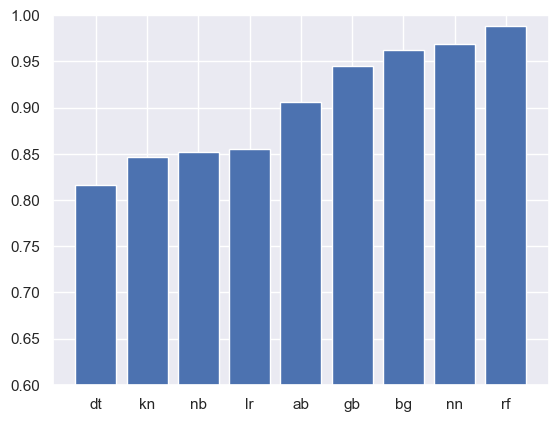

In [82]:
accuracies = [f1_score(y_val, lr.predict(X_val)), 
              f1_score(y_val, nb.predict(X_val)), 
              f1_score(y_val, kn.predict(X_val)),
              f1_score(y_val, dt.predict(X_val)), 
              f1_score(y_val, nn.predict(X_val)), 
              f1_score(y_val, bg.predict(X_val)),
              f1_score(y_val, ab.predict(X_val)), 
              f1_score(y_val, rf.predict(X_val)), 
              f1_score(y_val, gb.predict(X_val))]
models = ['lr','nb','kn','dt','nn','bg','ab','rf','gb']
data_tuples = list(zip(models,accuracies))
data = pd.DataFrame(data_tuples)
data = data.sort_values(1)
plt.bar(data[0], data[1])
plt.ylim(0.60,1)
plt.show()

In [83]:
data

,0,1
3,dt,0.816092
2,kn,0.847059
1,nb,0.852071
0,lr,0.855491
6,ab,0.905882
8,gb,0.944785
5,bg,0.962500
4,nn,0.969325
7,rf,0.987952


In [84]:
# Function to Evaluate the models
def avg_score(model):
    # apply kfold
    skf = StratifiedKFold(n_splits=10)
    # create lists to store the results from the different models 
    score_train = []
    score_val = []
    timer = []
    n_iter = []
    for train_index, val_index in skf.split(X,y):
        # get the indexes of the observations assigned for each partition
        X_train, X_val = X.iloc[train_index], X.iloc[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        # start counting time
        begin = time.perf_counter()
        # fit the model to the data
        model.fit(X_train, y_train)
        # finish counting time
        end = time.perf_counter()
        # check the mean accuracy for the train
        value_train = model.score(X_train, y_train)
        # check the mean accuracy for the validation
        value_val = model.score(X_val,y_val)
        # append the accuracies, the time and the number of iterations in the corresponding list
        score_train.append(value_train)
        score_val.append(value_val)
        timer.append(end-begin)
        n_iter.append(model.n_iter_)
    # calculate the average and the std for each measure (accuracy, time and number of iterations)
    avg_time = round(np.mean(timer),3)
    avg_train = round(np.mean(score_train),3)
    avg_val = round(np.mean(score_val),3)
    std_time = round(np.std(timer),2)
    std_train = round(np.std(score_train),2)
    std_val = round(np.std(score_val),2)
    avg_iter = round(np.mean(n_iter),1)
    std_iter = round(np.std(n_iter),1)
    
    return str(avg_time) + '+/-' + str(std_time), str(avg_train) + '+/-' + str(std_train),str(avg_val) + '+/-' + str(std_val), str(avg_iter) + '+/-' + str(std_iter)

In [85]:
# Function to display the results
def show_results(df, *args):
    """
    Receive an empty dataframe and the different models and call the function avg_score
    """
    count = 0
    # for each model passed as argument
    for arg in args:
        # obtain the results provided by avg_score
        time, avg_train, avg_val, avg_iter = avg_score(arg)
        # store the results in the right row
        df.iloc[count] = time, avg_train, avg_val, avg_iter
        count+=1
    return df

<a class="anchor" id="MODELS">

## 7.1 Models

</a>

<a class="anchor" id="MODEL.LR">

### 7.1.1 Logistic Regression

</a>

In [86]:
# help(LogisticRegression)

(0.75, 0.875)

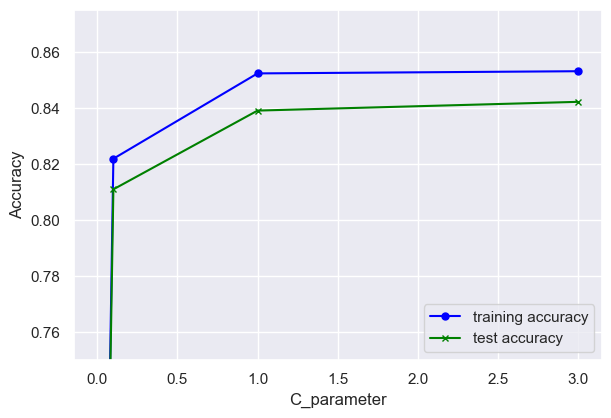

In [87]:
# Find the best value for  parameter to implement regularization and avoid overfiting

C_param_range = [0.001,0.01,0.1,1,3]

plt.figure(figsize=(15, 10))

# Apply logistic regression model to training data
lr = LogisticRegression(penalty='l1', solver = 'saga', C = i, random_state = 15)

# SEPAL Plot validation curve
train_scores, val_scores = validation_curve(estimator=lr
                                                            ,X=X_train
                                                            ,y=y_train
                                                            ,param_name='C'
                                                            ,param_range=C_param_range
                                                            )

train_mean = np.mean(train_scores,axis=1)
train_std = np.std(train_scores,axis=1)
test_mean = np.mean(val_scores,axis=1)
test_std = np.std(val_scores,axis=1)

plt.subplot(2,2,1)
plt.plot(C_param_range
            ,train_mean
            ,color='blue'
            ,marker='o'
            ,markersize=5
            ,label='training accuracy')
    
plt.plot(C_param_range
            ,test_mean
            ,color='green'
            ,marker='x'
            ,markersize=5
            ,label='test accuracy') 
    
plt.xlabel('C_parameter')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.ylim([0.75,0.875])

(0.75, 0.875)

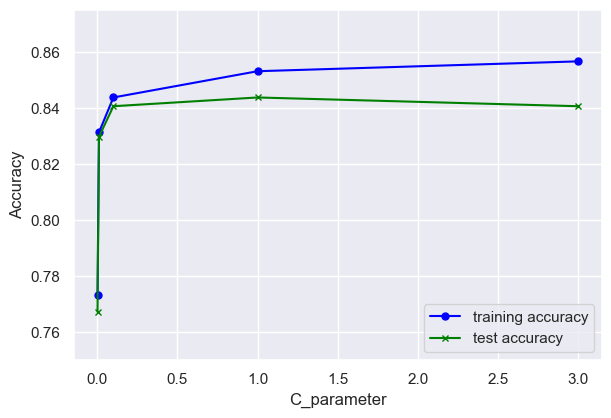

In [88]:
C_param_range = [0.001,0.01,0.1,1,3]

plt.figure(figsize=(15, 10))

# Apply logistic regression model to training data
lr = LogisticRegression(penalty='l2', solver = 'saga', C = i, random_state = 15)

# SEPAL Plot validation curve
train_scores, val_scores = validation_curve(estimator=lr
                                                            ,X=X_train
                                                            ,y=y_train
                                                            ,param_name='C'
                                                            ,param_range=C_param_range
                                                            )

train_mean = np.mean(train_scores,axis=1)
train_std = np.std(train_scores,axis=1)
test_mean = np.mean(val_scores,axis=1)
test_std = np.std(val_scores,axis=1)

plt.subplot(2,2,1)
plt.plot(C_param_range
            ,train_mean
            ,color='blue'
            ,marker='o'
            ,markersize=5
            ,label='training accuracy')
    
plt.plot(C_param_range
            ,test_mean
            ,color='green'
            ,marker='x'
            ,markersize=5
            ,label='test accuracy') 
    
plt.xlabel('C_parameter')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.ylim([0.75,0.875])

In [89]:
# Import the model and create an instance
log_model_l1 = LogisticRegression(penalty='l1', solver = 'saga', C = 1, random_state = 15)

# Fit the model to the train data
log_model_l1.fit(X_train, y_train)

# Predict the model with y_val
pred_val_lrl1 = log_model_l1.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val_lrl1),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val_lrl1),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val_lrl1),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val_lrl1),3))

Accuracy Score: 0.85
Precision Score: 0.815
Recall Score: 0.915
F1 Score: 0.862


In [90]:
# Import the model and create an instance
log_model_l2 = LogisticRegression(penalty='l2', solver = 'saga', C = 1, random_state = 15)

# Fit the model to the train data
log_model_l2.fit(X_train, y_train)

# Predict the model with y_val
pred_val_lrl2 = log_model_l2.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val_lrl2),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val_lrl2),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val_lrl2),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val_lrl2),3))

Accuracy Score: 0.844
Precision Score: 0.813
Recall Score: 0.902
F1 Score: 0.855


In [91]:
# check the mean accuracy for the train
value_train = log_model_l2.score(X_train, y_train)
# check the mean accuracy for the validation
value_val = log_model_l2.score(X_val,y_val)
name = ['Training', 'Validation']
score = [value_train, value_val]
print(list(zip(name, score)))

[('Training', 0.846875), ('Validation', 0.84375)]


<a class="anchor" id="MODEL.NN">

### 7.1.2 Neural Network

</a>

In [92]:
#help(MLPClassifier)

In [93]:
model = MLPClassifier(random_state = 0).fit(X_train, y_train)

# Predict the model, first version, with default attributes:
pred_val = model.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val),3))

Accuracy Score: 0.919
Precision Score: 0.888
Recall Score: 0.963
F1 Score: 0.924


In [94]:
# Changing hidden_layer_sizes:
# The number of hidden layers
# Increase the number of hidden layers might improve the accuracy or might not, it depend on the complexity of the problem
# Increase the number of hidden layers more than the sufficient ones will cause overfit on training set 
# and the decrease of the accuracy in the validation set
# The number of hidden units
# Using too few neurons in hidden layers will result in underfitting
# Using too many neurons in the hidden layer may result in overfitting and increase the time it takes to train the neural network
# The aim is to keep a good trade-off between the simplicity of the model and the performance accuracy!

# The default=(100,) 

model_simple = MLPClassifier(hidden_layer_sizes=(1), random_state = 15) # will result in underfitting
model_medium = MLPClassifier(hidden_layer_sizes=(12), random_state = 15) # Try to find the optimal number
model_complex = MLPClassifier(hidden_layer_sizes=(100,100,100,100,100), random_state = 15) # may overfit and increase the traininng time

df = pd.DataFrame(columns = ["Time","Train","Validation", "Iterations"], index = ['Simple_1','Medium_12','Complex_100'])
show_results(df, model_simple, model_medium, model_complex)

,Time,Train,Validation,Iterations
Simple_1,0.175+/-0.01,0.486+/-0.0,0.486+/-0.0,200.0+/-0.0
Medium_12,0.256+/-0.01,0.862+/-0.01,0.849+/-0.05,200.0+/-0.0
Complex_100,1.034+/-0.21,0.997+/-0.0,0.978+/-0.03,94.9+/-20.4


In [95]:
# Tring to find the optimal number for hidden_layer:

# The number of hidden neurons should be between the size of the input layer and the size of the output layer
# The number of hidden neurons should be 2/3 the size of the input layer, plus the size of the output layer
# The number of hidden neurons should be less than twice the size of the input layer

# if we assume the initial layers are 16

model_simple_ = MLPClassifier(hidden_layer_sizes=(12), random_state = 15) # 2/3 * 16 + 1
model_medium = MLPClassifier(hidden_layer_sizes=(16), random_state = 15) # number of input layers = 16  # I will keep going with this
model_complex = MLPClassifier(hidden_layer_sizes=(32), random_state = 15) # 2 * 16

df = pd.DataFrame(columns = ["Time","Train","Validation", "Iterations"], index = ['Simple_12','Medium_16','Complex_32'])
show_results(df, model_simple_, model_medium, model_complex)

,Time,Train,Validation,Iterations
Simple_12,0.259+/-0.02,0.862+/-0.01,0.849+/-0.05,200.0+/-0.0
Medium_16,0.278+/-0.02,0.872+/-0.01,0.861+/-0.03,200.0+/-0.0
Complex_32,0.292+/-0.01,0.905+/-0.0,0.881+/-0.03,200.0+/-0.0


<div class="alert alert-block alert-success">  
To avoid under and overfitting, and to keep a good trade-off between the simplicity of the model and the performance accuracy!<br>
<b>Hidden layer sizes</b> will be equal to <b>16.</b>   
</div>

In [96]:
# The number of iterations, by default, 
# sklearn defines the maximum number of iterations as 200, while this could be enough for simple datasets, 
# in complex problems we can try values higher that allow the model to converge

model_maxiter_200 = MLPClassifier(max_iter = 200, hidden_layer_sizes=(16), random_state = 15)
model_maxiter_300 = MLPClassifier(max_iter = 300, hidden_layer_sizes=(16), random_state = 15)
model_maxiter_1000 = MLPClassifier(max_iter = 1000, hidden_layer_sizes=(16), random_state = 15)

df = pd.DataFrame(columns = ["Time","Train","Validation", "Iterations"], index = ['max iter 200','max iter 300','max iter 1000'])
show_results(df, model_maxiter_200, model_maxiter_300, model_maxiter_1000)

,Time,Train,Validation,Iterations
max iter 200,0.251+/-0.01,0.872+/-0.01,0.861+/-0.03,200.0+/-0.0
max iter 300,0.378+/-0.01,0.88+/-0.01,0.87+/-0.04,300.0+/-0.0
max iter 1000,1.276+/-0.05,0.935+/-0.01,0.89+/-0.04,1000.0+/-0.0


<div class="alert alert-block alert-success">  
Better trad-off between train and validation score with a maximum <b>iterations</b> of <b>300</b>, and it is similar between train and validation
</div>

In [97]:
# The solver, adam is the default

# more about optimization http://www.robotics.stanford.edu/~ang/papers/icml11-OptimizationForDeepLearning.pdf

# L-BFGS is a good option for low dimensional models and for sparse data
# For our model, with the other parameters, it seems it overgit
# http://users.iems.northwestern.edu/~nocedal/PDFfiles/limited-memory.pdf

# SGD - If generalization is more important than time processing
# https://papers.nips.cc/paper/7003-the-marginal-value-of-adaptive-gradient-methods-in-machine-learning.pdf

# Adam - It achieves good results fast - good for complex models, if processing time is an issue
# https://arxiv.org/pdf/1412.6980.pdf


model_lbfgs = MLPClassifier(solver = 'lbfgs', max_iter = 300, hidden_layer_sizes=(16), random_state = 15)
model_sgd = MLPClassifier(solver = 'sgd', max_iter = 300, hidden_layer_sizes=(16), random_state = 15)
model_adam = MLPClassifier(solver = 'adam', max_iter = 300, hidden_layer_sizes=(16), random_state = 15)

df = pd.DataFrame(columns = ["Time","Train","Validation", "Iterations"], index = ['lbfgs','sgd','adam'])
show_results(df, model_lbfgs, model_sgd, model_adam)

,Time,Train,Validation,Iterations
lbfgs,0.091+/-0.03,0.995+/-0.0,0.978+/-0.01,152.5+/-41.1
sgd,0.336+/-0.01,0.827+/-0.01,0.821+/-0.05,300.0+/-0.0
adam,0.381+/-0.02,0.88+/-0.01,0.87+/-0.04,300.0+/-0.0


<div class="alert alert-block alert-success">  
The default <b>adam </b> have the best performance for the <b>solver</b>
</div>

In [98]:
# The learning rate initialization, fedault = 0.001 
# small lr, may never converge or may get stuck on a suboptimal solution
# Big lr, Weight changes can be so big that the optimizer overshoots the minimum and makes the loss worse

# the default seems be the best

model_lr_big = MLPClassifier(learning_rate_init = 0.5,solver = 'adam', max_iter = 300 , hidden_layer_sizes=(16), random_state = 15)
model_lr_medium = MLPClassifier(learning_rate_init = 0.001, solver = 'adam', max_iter = 300 , hidden_layer_sizes=(16), random_state = 15)
model_lr_small = MLPClassifier(learning_rate_init = 0.000001, solver = 'adam', max_iter = 300 , hidden_layer_sizes=(16), random_state = 15)

df = pd.DataFrame(columns = ["Time","Train","Validation", "Iterations"], index = ['big','medium','small'])
show_results(df, model_lr_big, model_lr_medium, model_lr_small)

,Time,Train,Validation,Iterations
big,0.113+/-0.02,0.9+/-0.02,0.882+/-0.04,87.8+/-19.4
medium,0.387+/-0.02,0.88+/-0.01,0.87+/-0.04,300.0+/-0.0
small,0.018+/-0.0,0.506+/-0.0,0.506+/-0.01,12.0+/-0.0


<div class="alert alert-block alert-success">  
The default <b>0.001</b> <b>learning rate initialization</b> seams to be the optimal learning rate, that swiftly reaches the minimum point
</div>

In [99]:
# The batch size can affect significantly the performance and the speed of your training.
# What happens when you put a batch through your network is that you average the gradients.
# default = 'auto' (min(200, n_samples))

# Small:
# The lower the batch size, the higher the probability of your estimate being less accurate, 
# since the networks weights can "jump" around if your data is noisy, and it might be unable to learn, 
# or it converges very slow. Besides that, the computation time is going to increase.

# Big:
# If your batch size is big enough, this will provide a stable enough estimate of what the gradient of the full dataset would be,
# since you will have fewer gradient updates per epoch.
# In the same logic, it is desired to speed up computation, due to a lower quantity of updates.

model_batch150 = MLPClassifier(batch_size = 150, learning_rate_init = 0.001, solver = 'adam', max_iter = 300 , hidden_layer_sizes=(16), random_state = 15)
model_batch200 = MLPClassifier(batch_size = 200, learning_rate_init = 0.001, solver = 'adam', max_iter = 300 , hidden_layer_sizes=(16), random_state = 15)
model_batch250 = MLPClassifier(batch_size = 250, learning_rate_init = 0.001, solver = 'adam', max_iter = 300 , hidden_layer_sizes=(16), random_state = 15)

df = pd.DataFrame(columns = ["Time","Train","Validation", "Iterations"], index = ['batch 150','batch 200','batch 250'])
show_results(df, model_batch150, model_batch200, model_batch250)

,Time,Train,Validation,Iterations
batch 150,0.481+/-0.03,0.885+/-0.0,0.866+/-0.04,300.0+/-0.0
batch 200,0.381+/-0.01,0.88+/-0.01,0.87+/-0.04,300.0+/-0.0
batch 250,0.327+/-0.02,0.876+/-0.01,0.861+/-0.03,300.0+/-0.0


<div class="alert alert-block alert-success">  
A <b>batch</b> size of <b>200</b> keeps a good trade off between accuracy and speed and train and validation score
</div>

In [100]:
model_neural_networks = MLPClassifier(batch_size = 20, learning_rate_init = 0.001, solver = 'adam', max_iter = 300 , hidden_layer_sizes=(16), random_state = 15).fit(X_train, y_train)

In [101]:
# Predict the model with y_val
pred_val_nn = model_neural_networks.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val_nn),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val_nn),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val_nn),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val_nn),3))

Accuracy Score: 0.888
Precision Score: 0.848
Recall Score: 0.951
F1 Score: 0.897


In [102]:
# check the mean accuracy for the train
value_train = model_neural_networks.score(X_train, y_train)
# check the mean accuracy for the validation
value_val = model_neural_networks.score(X_val,y_val)
name = ['Training', 'Validation']
score = [value_train, value_val]
print(list(zip(name, score)))

[('Training', 0.921875), ('Validation', 0.8875)]


In [103]:
# our best optimized model
# y_pred_nn = model_batch50.predict(test)
# df_nn = pd.DataFrame(y_pred_nn, index = test.index, columns = ["Disease"])
# df_nn.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\Group34_Version30.csv', index=True)

<a class="anchor" id="MODEL.BAGGING">

### 7.1.3 Ensemble - Bagging

</a>

In [104]:
# RepeatedStratifiedKFold named as cv and with splits equal to 10, the repetitions equal to 3, and the random state equal to 1.
cv = RepeatedStratifiedKFold(n_splits = 10, n_repeats = 3, random_state = 1)

In [105]:
# Function will allow us to obtain the f1 score for all the models we are going to create on the notebook, 
# and each model instance is going to be trained for 30 times, using the RepeatedStratifiedKFold

def return_f1score(model, X, y):
    n_scores = cross_val_score(model, X, y, scoring = 'f1', cv = cv)
    return n_scores

In [106]:
def return_results(models):
    results, names = [],[]
    for name, model in models.items():
        scores = return_f1score(model, X, y)
        results.append(scores)
        names.append(name)
        print('>%s %.3f (%.3f)' % (name, scores.mean(), scores.std()))
    
    plt.figure(figsize=(15,7))
    plt.boxplot(results, labels = names, showmeans = True)
    plt.xticks(fontsize=9)
    plt.show()

In [107]:
#help(BaggingClassifier)

>DecisionTreeClassifier()_bagging 0.977 (0.020)
>DecisionTreeClassifier() 0.979 (0.018)
>KNeighborsClassifier()_bagging 0.882 (0.031)
>KNeighborsClassifier() 0.859 (0.029)
>LogisticRegression()_bagging 0.854 (0.039)
>LogisticRegression() 0.853 (0.043)


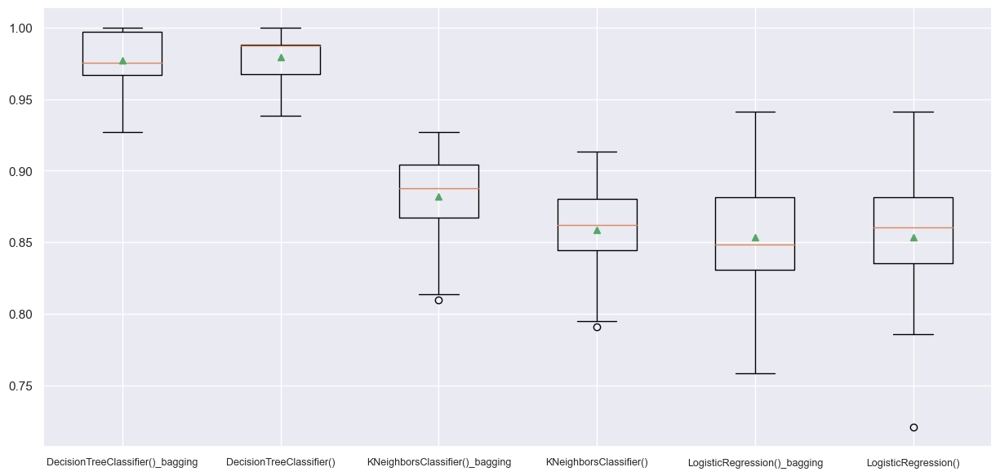

In [108]:
# base_estimator | The base estimator to fit on random subsets of the dataset.
# default = None | DecisionTreeClassifier
# Comparing the f1 score with three regressors, Decision Tree, KNeighbors and Logistic Regression
# With and without bagging
# Decision Trees are the most common algorithm used in bagging, 
# since they perform well in general and are easy to configure to have a high variance.

dt = DecisionTreeClassifier()
knn = KNeighborsClassifier()
lr = LogisticRegression()

def get_models(*args):
    models = dict()
    for arg in args:
        models[str(arg) + '_bagging'] = BaggingClassifier(base_estimator = arg, random_state = 15)      
        models[str(arg)] = arg  
    return models

models = get_models(dt, knn, lr)
return_results(models)

<div class="alert alert-block alert-success">  
The best F1 score ans lowest standar devation is for the <b>base estimator</b> is the default <b>decision tree </b>   
</div>

>2 0.928 (0.022)
>5 0.972 (0.020)
>10 0.977 (0.020)
>20 0.975 (0.019)
>30 0.978 (0.018)
>50 0.980 (0.018)
>100 0.979 (0.020)
>150 0.979 (0.022)
>200 0.979 (0.022)


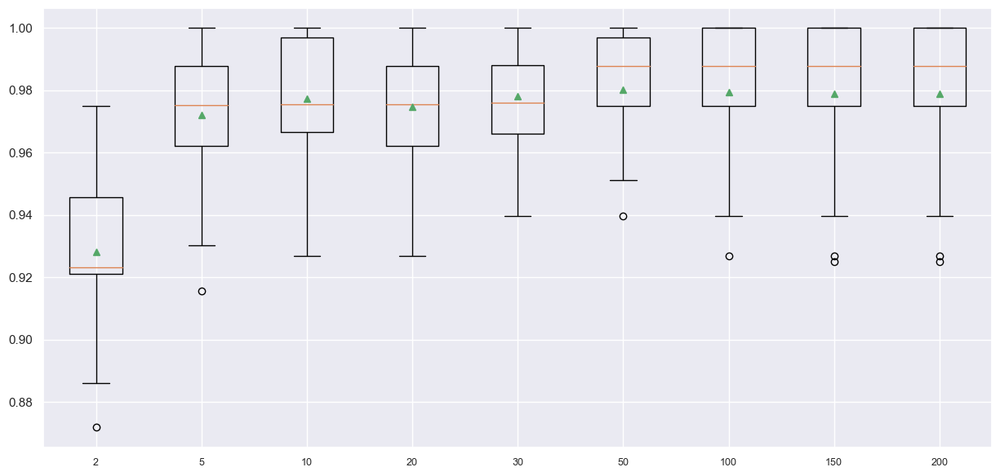

In [109]:
# The best model from the 6 experiments is the bagging with Decision Trees
# base_estimator | The base estimator to fit on random subsets of the dataset.
# default = 10 | DecisionTreeClassifier
def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = BaggingClassifier(n_estimators = value, random_state = 15)      
    return models

models = get_models([2,5,10,20,30,50,100,150,200])
return_results(models)

<div class="alert alert-block alert-success">  
Tipically, the <b>number of trees</b> is increased until the model performance stabilizes.
In this case, the results suggest that increasing the number of estimators on the bagging seems 
to improve our model's performance. 
With only two decision trees as estimators, we achieve an f1 score of 0.928, 
and there is a rise in the performance if we add more estimators to the bagging.
It seems that after <b>50</b> trees the <b>model stabilises</b> 
</div>

>0.1 0.854 (0.043)
>0.2 0.908 (0.038)
>0.4 0.954 (0.033)
>0.6 0.969 (0.026)
>0.8 0.978 (0.020)
>1.0 0.980 (0.018)


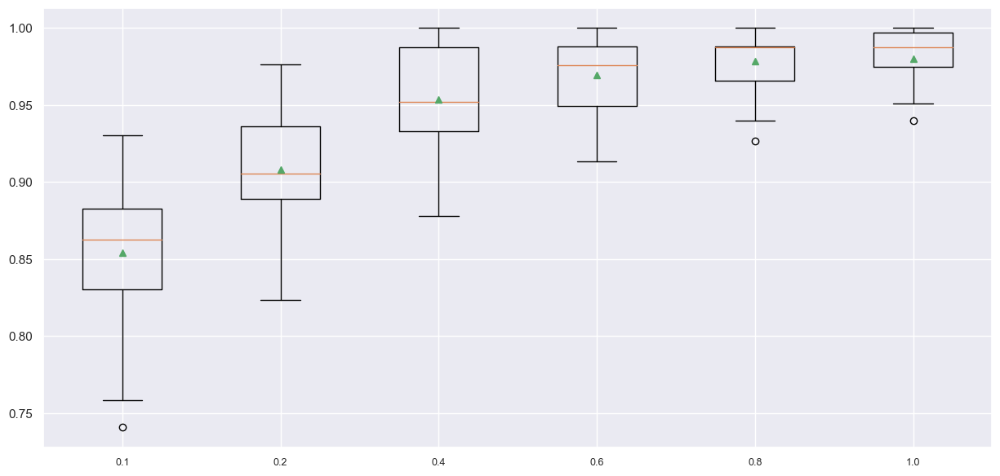

In [110]:
# max_samples | The number of samples to draw from X to train each base estimator (with replacement by default)
# default = 1.0

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = BaggingClassifier(n_estimators =50, max_samples = value, random_state = 15)      
    return models

models = get_models([0.1,0.2,0.4,0.6,0.8,1.0])
return_results(models)

<div class="alert alert-block alert-success"> 
By default, sklearn creates a <b>bootstrap</b> sample that has the same number of examples as the original dataset. 
Using a smaller dataset can increase the variance of the resulting decision trees 
and can result in better overall performance.
In this case, we can verify that using <b>100%</b> the size of the training data is the value that gives us the best results, for all the tested values.
</div>

>0.1 0.851 (0.034)
>0.2 0.953 (0.030)
>0.4 0.981 (0.021)
>0.6 0.982 (0.022)
>0.8 0.980 (0.020)
>1.0 0.980 (0.018)


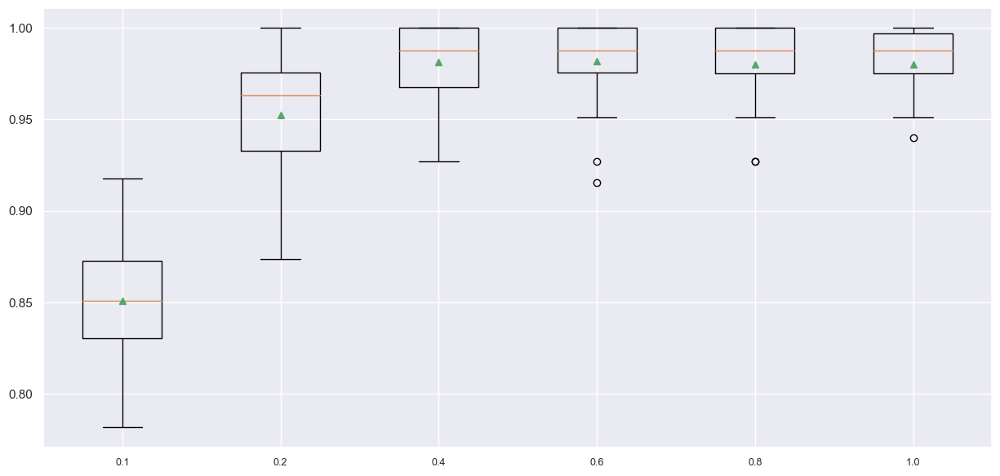

In [111]:
# max_features | The number of features to draw from X to train each base estimator (without replacement by default)
# default = 1.0

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = BaggingClassifier(n_estimators =50, max_features = value, random_state = 15)      
    return models

models = get_models([0.1,0.2,0.4,0.6,0.8,1.0])
return_results(models)

<div class="alert alert-block alert-success"> 

In this case, we can see how the <b>proportion</b> of variables introduced in the fitting is important to achieve a better performance.
<b>60%</b> of our variables are enough to achieve the best performance, if we increase, the performance decreases.
</div>

>True 0.982 (0.022)
>False 0.983 (0.020)


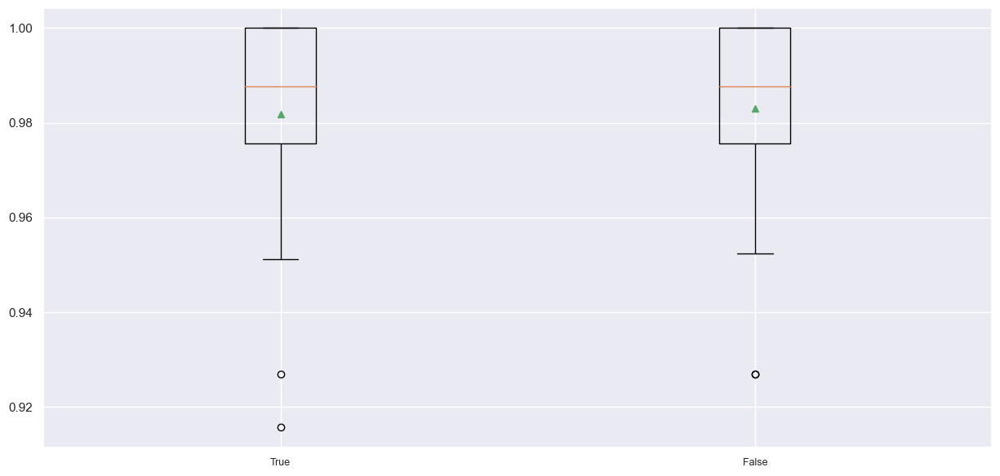

In [112]:
# bootstrap | Whether samples are drawn with replacement. If False, sampling without replacement is performed.
# default = True

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = BaggingClassifier(n_estimators =50, max_features =0.6, bootstrap = value, random_state = 15)      
    return models

models = get_models([True, False])
return_results(models)

<div class="alert alert-block alert-success"> 
We have the almost the same performance with or without <b>bootstrap</b>, so we will keep it as <b>True</b>
</div>

>True 0.983 (0.023)
>False 0.982 (0.022)


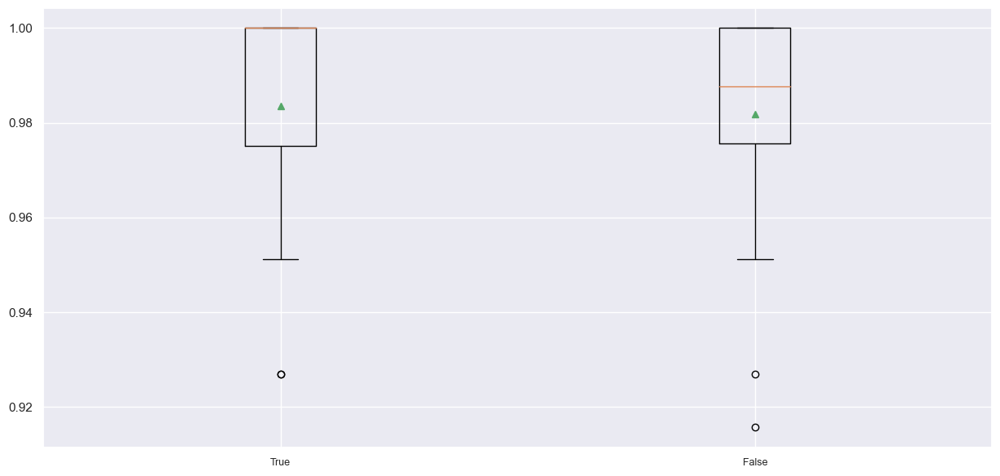

In [113]:
# bootstrap_features | Whether features are drawn with replacement.
# default = False

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = BaggingClassifier(n_estimators =50, max_features =0.6, bootstrap_features = value, random_state = 15)      
    return models

models = get_models([True, False])
return_results(models)

<div class="alert alert-block alert-success"> 
By the results we can verify that drawn features with <b>replacement</b> can lead to slitly worst F1 score, so keeping it as <b>False</b>
</div>

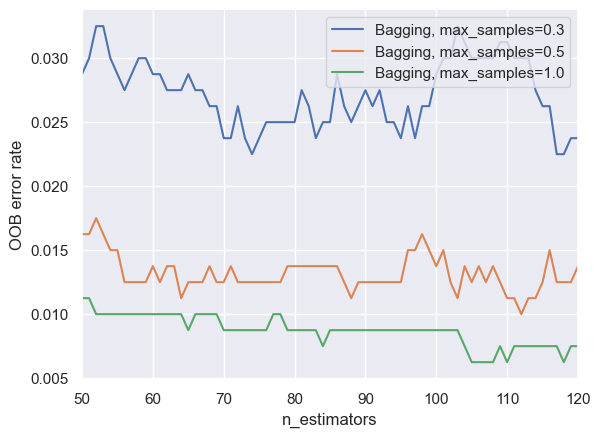

In [114]:
# oob_score | Whether to use out-of-bag samples to estimate the generalization error. Only available if bootstrap=True.
# default = False
# If we are using bagging, there’s a chance that a sample would never be selected, while anothers may be selected multiple time
# when the dataset is big enough, 37% of its samples are never selected and we could use it to test our model.

# Defining three different models:

ensemble_clfs = {
    "Bagging, max_samples=0.3": BaggingClassifier(max_features =0.6, oob_score=True, max_samples=0.3, random_state=15),
    "Bagging, max_samples=0.5": BaggingClassifier(max_features =0.6, oob_score=True, max_samples=0.5, random_state=15),
    "Bagging, max_samples=1.0": BaggingClassifier(max_features =0.6, oob_score=True, max_samples=1.0, random_state=15),
}

# Range of `n_estimators` values to explore.
min_estimators = 50
max_estimators = 120

# 
error_rate = dict((label, []) for label in ensemble_clfs)
for label, clf in ensemble_clfs.items():
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X, y)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))
        
# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.show()

In [115]:
model_bagging = BaggingClassifier(n_estimators =50, max_features =0.6, random_state = 15).fit(X_train,y_train)

In [116]:
# Predict the model with y_val
pred_val_bg = model_bagging.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val_bg),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val_bg),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val_bg),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val_bg),3))

Accuracy Score: 0.988
Precision Score: 0.976
Recall Score: 1.0
F1 Score: 0.988


In [117]:
# check the mean accuracy for the train
value_train = model_bagging.score(X_train, y_train)
# check the mean accuracy for the validation
value_val = model_bagging.score(X_val,y_val)
name = ['Training', 'Validation']
score = [value_train, value_val]
print(list(zip(name, score)))

[('Training', 1.0), ('Validation', 0.9875)]


In [118]:
# our best optimized model
#y_pred_bg = model_bagging.predict(test)
#df = pd.DataFrame(y_pred_bg, index = test.index, columns = ['Disease'])
#df.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\Group34_Version34.csv', index=True)

<a class="anchor" id="MODEL.RANDOMFORAST">

### 7.1.4 Ensemble - Random Forest

</a>

### In theory: 
1. Random Forest works similar to bagging except for the fact that not all features(independent variables) are selected in a subset
    - Note1: In sklearn you can define also the number of features in bagging, so in practice you are applying Random Forests in step 9 if you are using a value of max_features lower than 1.0;
    - Note2: In sklearn, the RandomForests can also include all of the features if max_features = None. By default, the max_features applied in RandomForests is the sqrt(n_features). <br><br>

2. Random Forest works only with Decision Trees, Whereat in bagging any algorithm can be used. <br><br>

3. In bagging the subsets differ from original data only in terms of number of rows but in Random forest the subsets differ from the original data both in terms of number of rows as well as number of columns.
    - Note: As mentioned previously, in sklearn you can also define the number of features in bagging.

In [119]:
# In Theory we don't need it

In [120]:
#help(RandomForestClassifier)

>10 0.978 (0.016)
>20 0.980 (0.023)
>50 0.981 (0.023)
>100 0.982 (0.021)
>200 0.981 (0.021)
>300 0.981 (0.021)


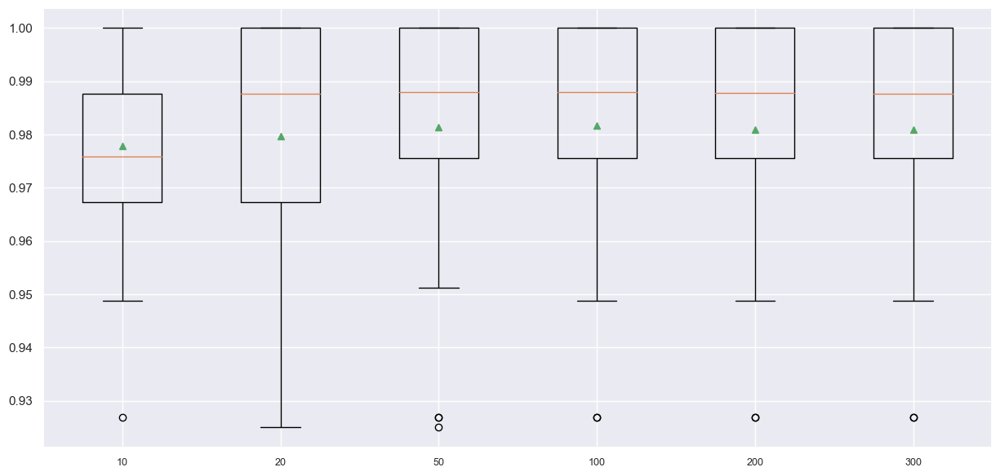

In [121]:
# n_estimators | The number of trees in the forest.
# default = 100

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = RandomForestClassifier(n_estimators = value, random_state = 15)      
    return models

models = get_models([10,20,50,100,200,300])
return_results(models)

<div class="alert alert-block alert-success"> 
We can keep <b>Number of estimators</b> as <b>100</b>
</div>

In [122]:
#bootstrap | Whether bootstrap samples are used when building trees. 
# If False, the whole dataset is used to build each tree.
#default = True

>True 0.982 (0.021)
>False 0.981 (0.021)


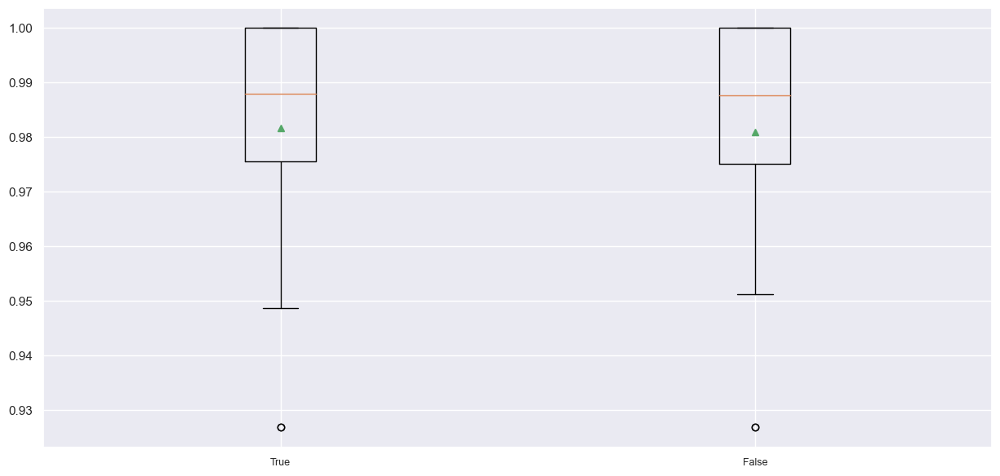

In [123]:
def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = RandomForestClassifier(n_estimators = 100, bootstrap = value, random_state = 15)      
    return models

models = get_models([True, False])
return_results(models)

<div class="alert alert-block alert-success"> 
We can keep <b>Bootstrap</b> set as <b>True</b>
</div>

>0.2 0.920 (0.034)
>0.4 0.968 (0.026)
>0.6 0.977 (0.023)
>0.8 0.983 (0.021)
>None 0.982 (0.021)


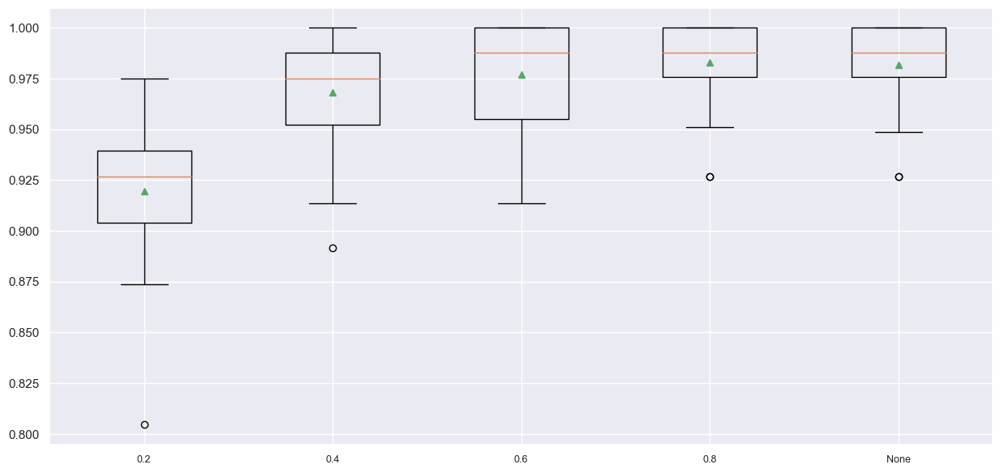

In [124]:
# max_samples | If bootstrap is True, the number of samples to draw from X to train each base estimator.
# default = None | X.shape[0] samples

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = RandomForestClassifier(n_estimators = 100, max_samples = value, random_state = 15)      
    return models

models = get_models([0.2,0.4,0.6,0.8,None])
return_results(models)

<div class="alert alert-block alert-success"> 
We can keep <b>max_samples</b> set as <b>None</b>
</div>

>1 0.796 (0.037)
>2 0.808 (0.040)
>4 0.859 (0.039)
>6 0.936 (0.032)
>8 0.975 (0.022)
>10 0.981 (0.021)
>None 0.981 (0.021)


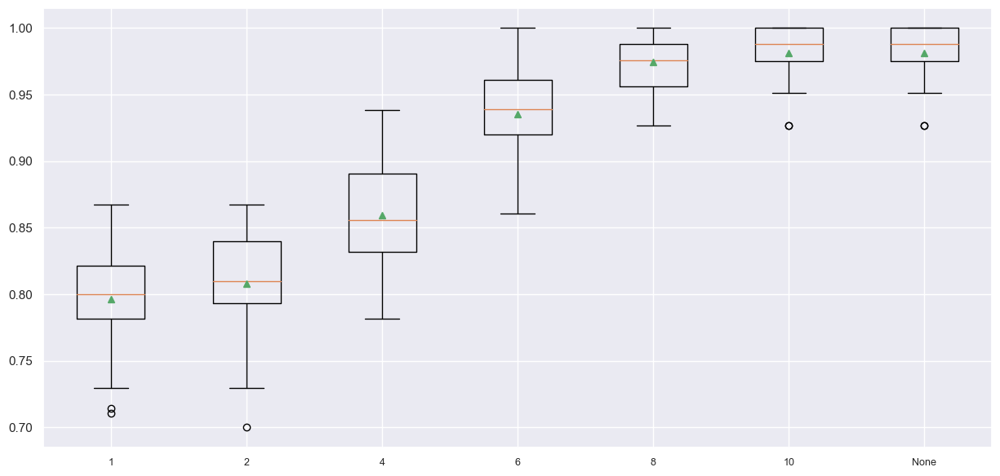

In [125]:
# max_depth | The maximum depth of the tree. 
# If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = RandomForestClassifier(n_estimators = 100, bootstrap = False, max_depth = value, random_state = 15)      
    return models

models = get_models([1,2,4,6,8,10,None])
return_results(models)

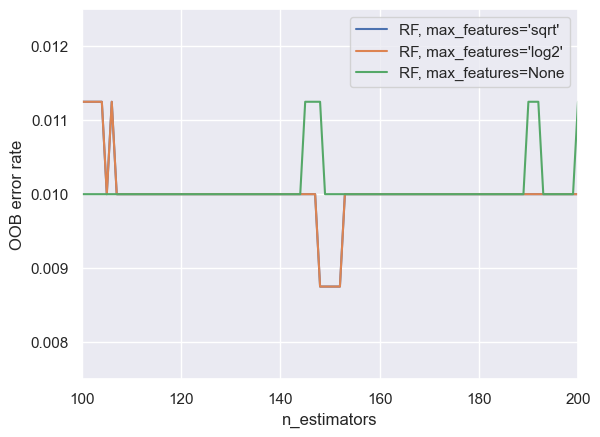

In [126]:
# Apply out-of-bag samples

ensemble_clfs = {
    "RF, max_features='sqrt'": RandomForestClassifier( oob_score=True, max_features="sqrt", random_state=15),
    "RF, max_features='log2'": RandomForestClassifier( oob_score=True, max_features='log2', random_state=15),
    "RF, max_features=None": RandomForestClassifier( oob_score=True, max_features=None,  random_state=15),
}

# Range of `n_estimators` values to explore.
min_estimators = 100
max_estimators = 200

error_rate = dict((label, []) for label in ensemble_clfs)
for label, clf in ensemble_clfs.items():
    for i in range(min_estimators, max_estimators + 1):
        clf.set_params(n_estimators=i)
        clf.fit(X, y)

        # Record the OOB error for each `n_estimators=i` setting.
        oob_error = 1 - clf.oob_score_
        error_rate[label].append((i, oob_error))
        
# Generate the "OOB error rate" vs. "n_estimators" plot.
for label, clf_err in error_rate.items():
    xs, ys = zip(*clf_err)
    plt.plot(xs, ys, label=label)

plt.xlim(min_estimators, max_estimators)
plt.xlabel("n_estimators")
plt.ylabel("OOB error rate")
plt.legend(loc="upper right")
plt.ylim([0.0075,0.0125])
plt.show()

In [127]:
model_random_forest = RandomForestClassifier(n_estimators = 100, random_state = 15).fit(X_train, y_train)

In [128]:
# Predict the model with y_val
pred_val_rf = model_random_forest.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val_rf),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val_rf),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val_rf),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val_rf),3))

Accuracy Score: 0.988
Precision Score: 0.976
Recall Score: 1.0
F1 Score: 0.988


In [129]:
# check the mean accuracy for the train
value_train = model_random_forest.score(X_train, y_train)
# check the mean accuracy for the validation
value_val = model_random_forest.score(X_val,y_val)
name = ['Training', 'Validation']
score = [value_train, value_val]
print(list(zip(name, score)))

[('Training', 1.0), ('Validation', 0.9875)]


In [130]:
# our best optimized model
#y_pred_rf = model_random_forest.predict(test)
#df = pd.DataFrame(y_pred_rf, index = test.index, columns = ['Disease'])
#df.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\Group34_Version35.csv', index=True)

<a class="anchor" id="MODEL.ADABOOST">

### 7.1.5 Ensemble - Adaptive Boosting

</a>

  
### The difference between RF and AdaBoost



- In a Random Forest, each time you make a tree, by default you make a full grown up tree;
- In Adaboost, the trees are usually just a node and two leaves (also denominated as stump); Stumps use only one variable to make a decision. They are weak learners.
<h5><center>Adaboost combines a lot of weak learners to make classifications. The weak learners are almost always stumps.</center></h5>
<hr>
    
- In a Random Forest, each tree has an equal vote on the final classification;
- In AdaBoost, some stumps have more weight on voting than others.
<h5><center>In adaboost, some stumps get more say in the classification than others.</center></h5>
<hr>



- In a Random Forest, each decision tree is made independently of the others;
- In a Forest of Stumps made with AdaBoost, order is important - the errors that the first stump makes influence how the second stump is made and so on.
<h5><center>In adaboost, each stump is made by taking the previous stump's mistakes into account.</center></h5>
<hr>

In [131]:
# help(AdaBoostClassifier)

In [132]:
# base_estimator | The base estimator from which the boosted ensemble is built.
# default = None | DecisionTreeClassifier with max_depth = 1

# A decision tree with one level (a stump) is used as the weak learner by default.
# We can make the models used in the ensemble less weak (more skillful) by increasing the depth of the decision tree.

>1 0.872 (0.035)
>2 0.982 (0.021)
>3 0.980 (0.026)
>4 0.981 (0.020)
>5 0.985 (0.019)
>6 0.980 (0.021)


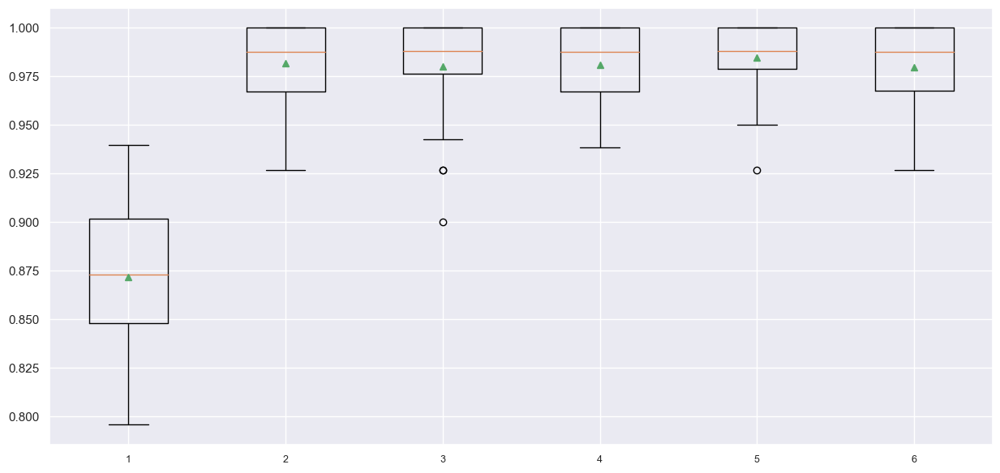

In [133]:
def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth=value), random_state = 15)      
    return models

models = get_models([1,2,3,4,5,6])
return_results(models)

<div class="alert alert-block alert-success"> 
In this case, we can use a <b>base_estimator</b> as  <b>5</b>, it is the one with best results with a lower standar deviation.
</div>

#### Changing the algorithm

- The default algorithm used in the ensemble is a decision tree, although other algorithms can be used.

- The intent is to use very simple models, called weak learners. Also, the scikit-learn implementation requires that any models used must also support weighted samples, as they are how the ensemble is created by fitting models based on a weighted version of the training dataset.

- The base model can be specified via the “base_estimator” argument. The base model must also support predicting probabilities or probability-like scores in the case of classification.

>ad_LR 0.845 (0.038)
>ad_def 0.872 (0.035)


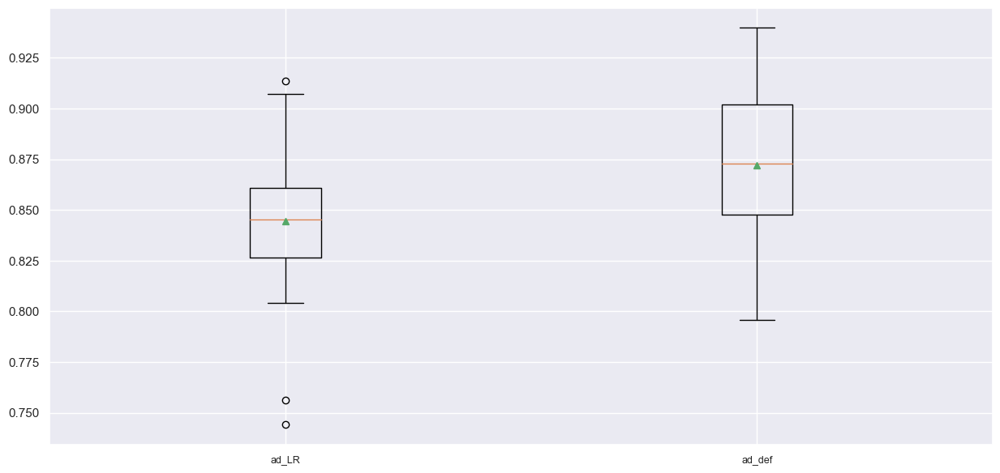

In [134]:
def get_models():
    models = dict()
    models['ad_LR'] = AdaBoostClassifier(base_estimator = LogisticRegression(max_iter=500), random_state = 15)  
    models['ad_def'] = AdaBoostClassifier(random_state = 15)  
    return models

models = get_models()
return_results(models)

<div class="alert alert-block alert-success"> 
The default algorithm used in the ensemble is a <b>decision tree</b> and is best comparing with logistic regression
</div>

>2 0.927 (0.034)
>5 0.976 (0.020)
>10 0.981 (0.021)
>20 0.981 (0.022)
>30 0.984 (0.020)
>50 0.985 (0.019)
>100 0.985 (0.019)
>150 0.983 (0.021)


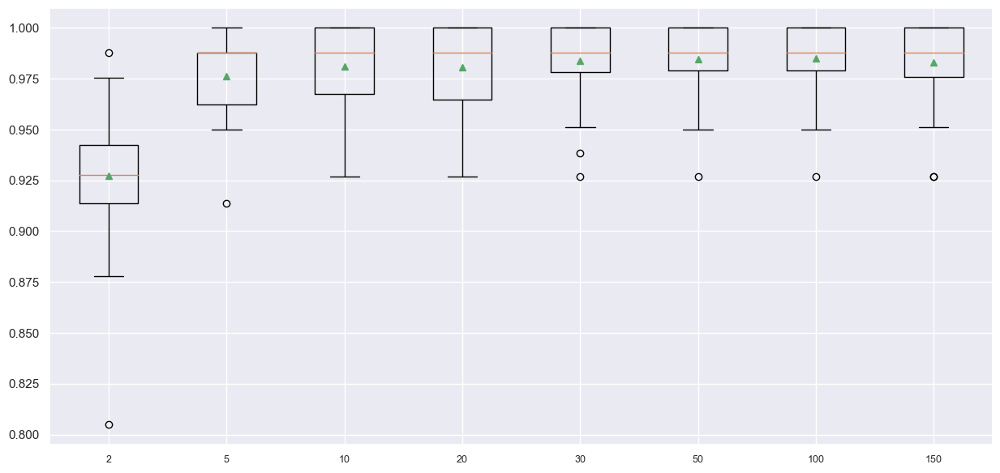

In [135]:
# n_estimators | The maximum number of estimators at which boosting is terminated. 
# In case of perfect fit, the learning procedure is stopped early.
# default = 50
# Depending of the complexity of the data, 
# the number of trees added to the model sometimes needs to be high for the model to work well, 
# often hundreds, if not thousands.

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth=5), n_estimators = value, random_state = 15)      
    return models

models = get_models([2,5,10,20,30,50,100,150])
return_results(models)

<div class="alert alert-block alert-success"> 
It has one of the best scores and a low std The default number of estimators as <b>50</b> performs the best F1 score and standard deviation
</div>

In [136]:
# learning_rate | Weight applied to each classifier at each boosting iteration. 
# A higher learning rate increases the contribution of each classifier. 
# There is a trade-off between the learning_rate and n_estimators parameters.
# default = 1.0

# AdaBoost also supports a learning rate that controls the contribution of each model to the ensemble prediction. 
# This is controlled by the “learning_rate” argument and by default is set to 1.0 or full contribution.
# Smaller or larger values might be appropriate depending on the number of models used in the ensemble. 
# There is a balance between the contribution of the models and the number of trees in the ensemble:
# More trees may require a smaller learning rate;
# Fewer trees may require a larger learning rate.
# It is common to use values between 0 and 1 and sometimes very small values to avoid overfitting such as 0.1, 0.01 or 0.001.

>0.1 0.979 (0.023)
>0.2 0.981 (0.019)
>0.3 0.985 (0.018)
>0.4 0.983 (0.019)
>0.5 0.981 (0.019)
>0.6 0.982 (0.023)
>0.7 0.982 (0.019)
>0.8 0.979 (0.024)
>0.9 0.984 (0.021)
>1.0 0.985 (0.019)


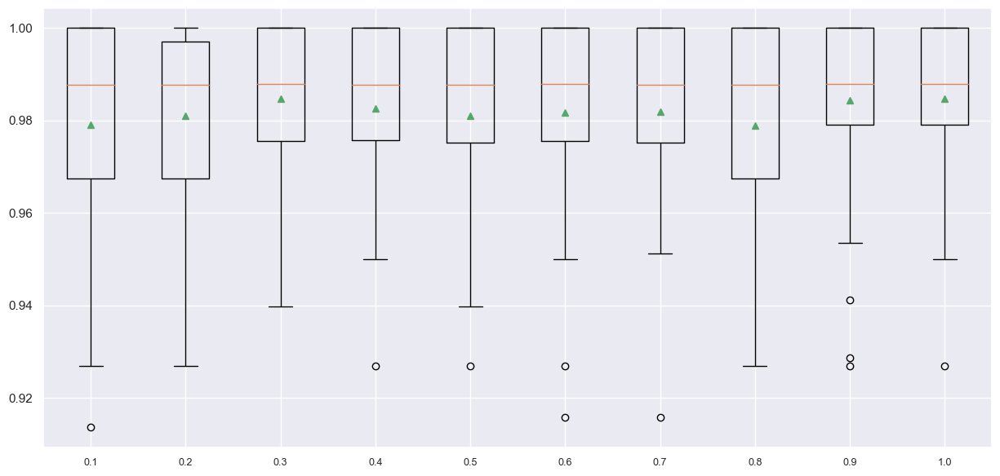

In [137]:
def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth=5), learning_rate = value, random_state = 15)      
    return models

models = get_models([0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
return_results(models)

<div class="alert alert-block alert-success"> 
All the scores are realy good, so to avoid overfiting we will chose the small one <b>0.1</b> 
</div>

>SAMME 0.958 (0.026)
>SAMME.R 0.979 (0.023)


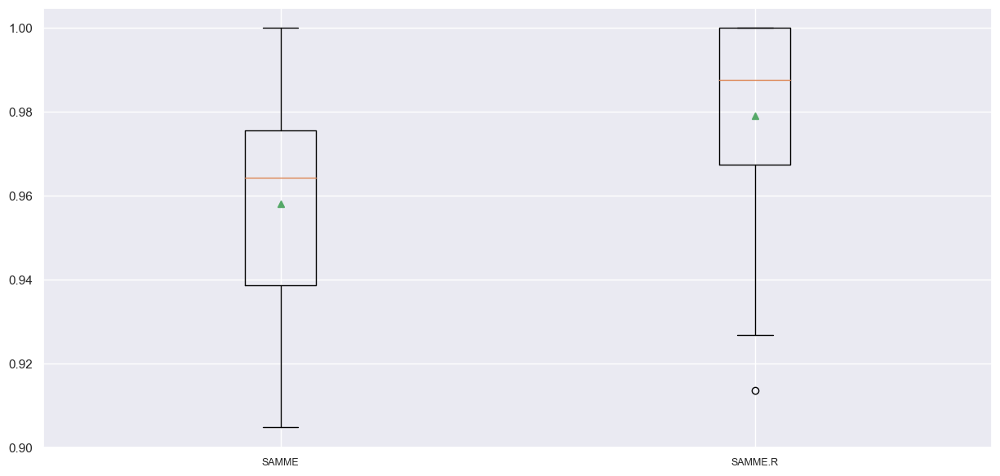

In [138]:
# algorithm | If ‘SAMME.R’ then use the SAMME.R real boosting algorithm. base_estimator must support calculation of class probabilities. 
# If ‘SAMME’ then use the SAMME discrete boosting algorithm.
# default = "SAMME.R"
# By default, AdaBoost uses SAMME.R algorithm, where AdaBoost use the predicted class probabilities to adapt based on the error.
# You can also use the SAMME algorithm, where instead of using the probabilities, you use the predicted class labels.

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth=5), learning_rate = 0.1, algorithm = value, random_state = 15)      
    return models

models = get_models(["SAMME","SAMME.R"])
return_results(models)

<div class="alert alert-block alert-success"> 
the default is the best
</div>

In [139]:
model_AdaBoost= AdaBoostClassifier(base_estimator = DecisionTreeClassifier(max_depth=5), learning_rate = 0.1,random_state = 15).fit(X_train, y_train)

In [140]:
# Predict the model with y_val
pred_val_ab = model_AdaBoost.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val_ab),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val_ab),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val_ab),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val_ab),3))

Accuracy Score: 0.969
Precision Score: 0.975
Recall Score: 0.963
F1 Score: 0.969


In [141]:
# check the mean accuracy for the train
value_train = model_AdaBoost.score(X_train, y_train)
# check the mean accuracy for the validation
value_val = model_AdaBoost.score(X_val,y_val)
name = ['Training', 'Validation']
score = [value_train, value_val]
print(list(zip(name, score)))

[('Training', 1.0), ('Validation', 0.96875)]


In [142]:
# our best optimized model
#y_pred_ab = model_AdaBoost.predict(test)
#df = pd.DataFrame(y_pred_ab, index = test.index, columns = ['Disease'])
#df.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\Group34_Version36.csv', index=True)

<a class="anchor" id="MODEL.GRADIENTBOOSTING">

### 7.1.6 Ensemble - Gradient_Boosting

</a>

>0.001 0.838 (0.030)
>0.01 0.850 (0.035)
>0.1 0.952 (0.026)
>0.3 0.979 (0.026)
>0.5 0.983 (0.021)
>0.8 0.985 (0.020)
>1.0 0.985 (0.018)


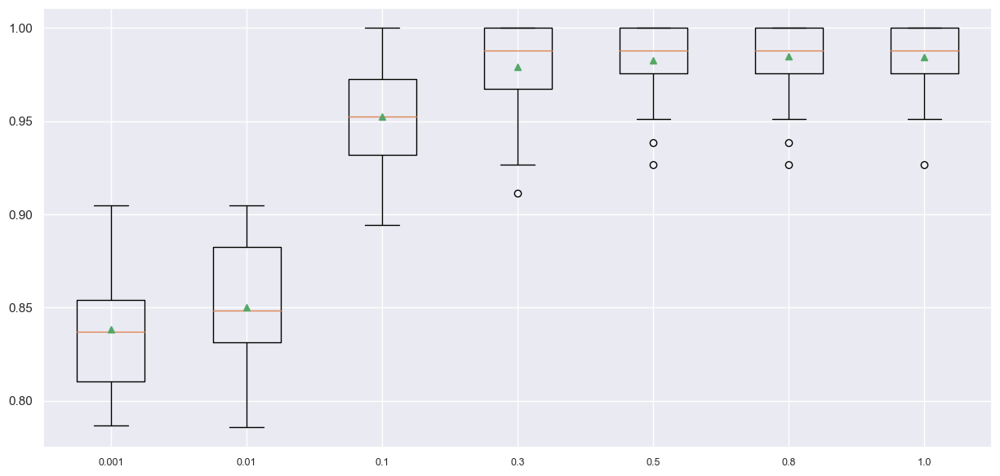

In [143]:
# learning_rate | Learning rate shrinks the contribution of each tree by learning_rate. 
# There is a trade-off between learning_rate and n_estimators.
# default = "0.1"
# Learning rate controls the amount of contribution that each model has on the ensemble prediction.
# Smaller rates may require more decision trees in the ensemble, whereas larger rates may require an ensemble with fewer trees. 
# - It is common to explore learning rate values on a log scale, such as between a very small value like 0.0001 and 1.0.

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(learning_rate = value, random_state = 15)      
    return models

models = get_models([0.001, 0.01, 0.1, 0.3, 0.5, 0.8, 1.0])
return_results(models)

<div class="alert alert-block alert-success"> 
In this case, we can see that a high learning rate results in better performance on this dataset.
</div>

In [144]:
# We would expect that adding more trees to the ensemble for the smaller learning rates would further lift performance. 
# This highlights the trade-off between the number of trees (speed of training) and learning rate, e.g. 
# we can fit a model faster by using fewer trees and a larger learning rate.

>0.001 0.847 (0.033)
>0.01 0.917 (0.028)
>0.1 0.983 (0.020)
>0.3 0.980 (0.024)
>0.5 0.981 (0.020)
>0.8 0.981 (0.021)
>1.0 0.981 (0.018)


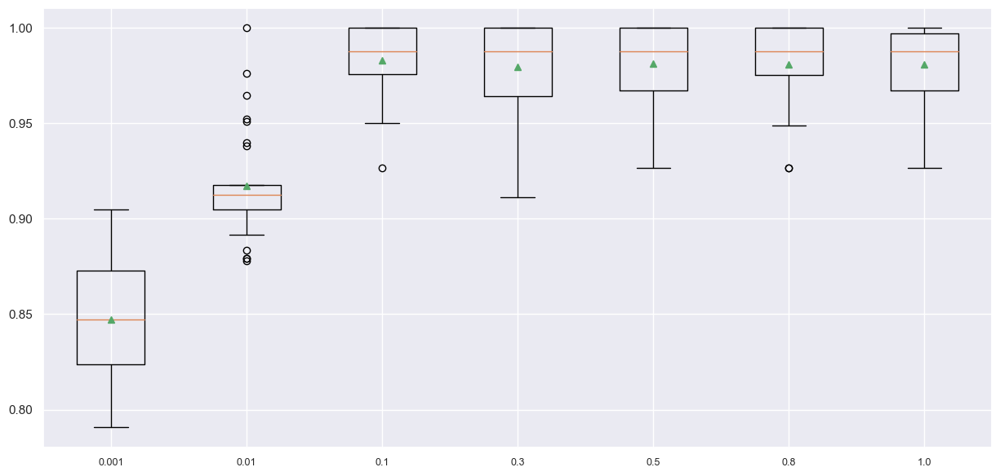

In [145]:
def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(learning_rate = value, random_state = 15, n_estimators = 500)      
    return models

models = get_models([0.001, 0.01, 0.1, 0.3, 0.5, 0.8, 1.0])
return_results(models)

>2 0.838 (0.031)
>5 0.847 (0.034)
>10 0.851 (0.036)
>20 0.873 (0.037)
>30 0.892 (0.031)
>50 0.919 (0.029)
>100 0.952 (0.026)
>150 0.970 (0.020)
>200 0.976 (0.023)
>500 0.983 (0.020)


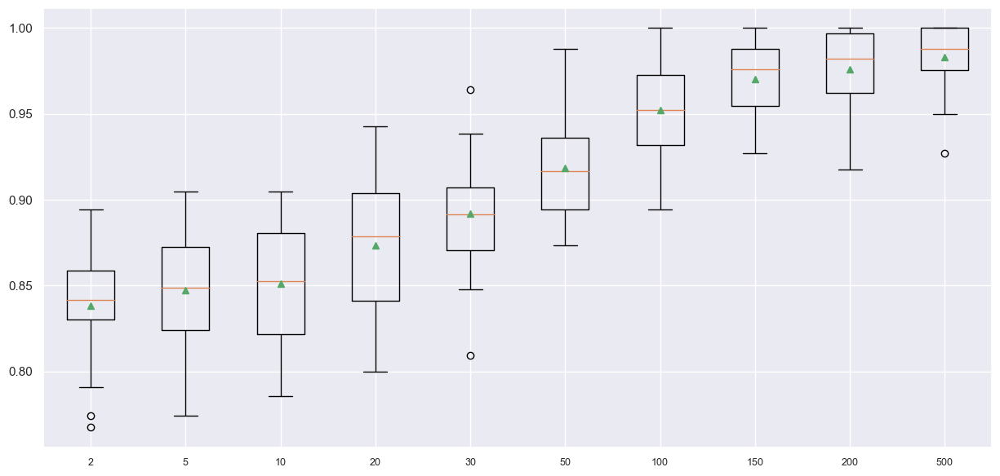

In [146]:
# Let's check other n_estimators:
# n_estimators | The number of boosting stages to perform. 
# Gradient boosting is fairly robust to over-fitting so a large number usually results in better performance.
# default = 100
# Recall that decision trees are added to the model sequentially 
# in an effort to correct and improve upon the predictions made by prior trees. As such, more trees is often better.
# The number of trees must also be balanced with the learning rate, e.g. 
# more trees may require a smaller learning rate, fewer trees may require a larger learning rate.

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(learning_rate = 0.1, n_estimators = value, random_state = 15)      
    return models

models = get_models([2,5,10,20,30,50,100,150,200,500])
return_results(models)

<div class="alert alert-block alert-success"> 
To avoid overfitting we set learning_rate = 0.1 and the n_estimators = 500 leads to a better performance
</div>

In [147]:
# For our dataset and looking at the results, using around 80% - 100% of the size of our training data 
# to build each tree leads to better results.

>2 0.984 (0.022)
>0.5 0.984 (0.020)
>sqrt 0.984 (0.021)
>log2 0.984 (0.021)
>None 0.983 (0.020)


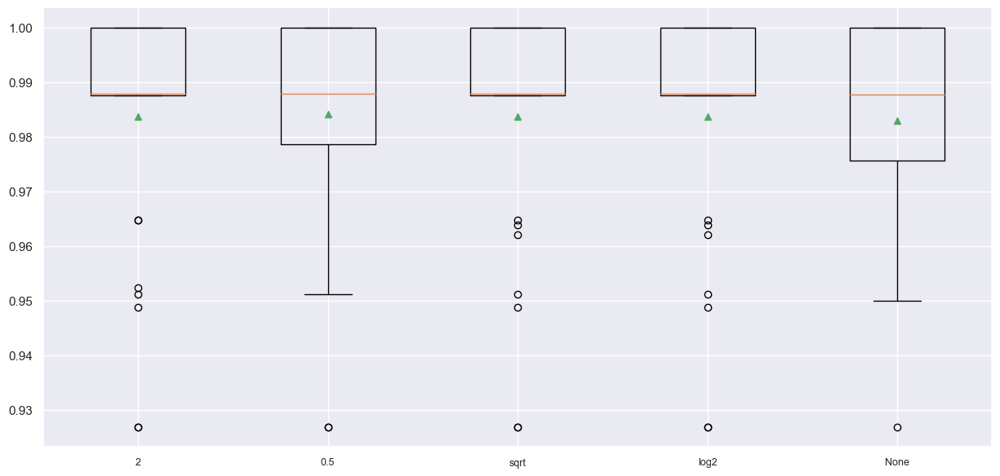

In [148]:
# max_features | The number of features to consider when looking for the best split.
# default = None
# Similarly to the number of samples, the number of features used to fit each decision tree can be varied, 
# and introduces additional variance into the model, which may improve performance, 
# although it might require an increase in the number of trees.

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(learning_rate = 0.1, n_estimators = 500, max_features = value, random_state = 15)      
    return models

models = get_models([2,0.5,'sqrt','log2',None])
return_results(models)

>2 0.984 (0.022)
>0.5 0.984 (0.020)
>sqrt 0.984 (0.021)
>log2 0.984 (0.021)
>None 0.983 (0.020)


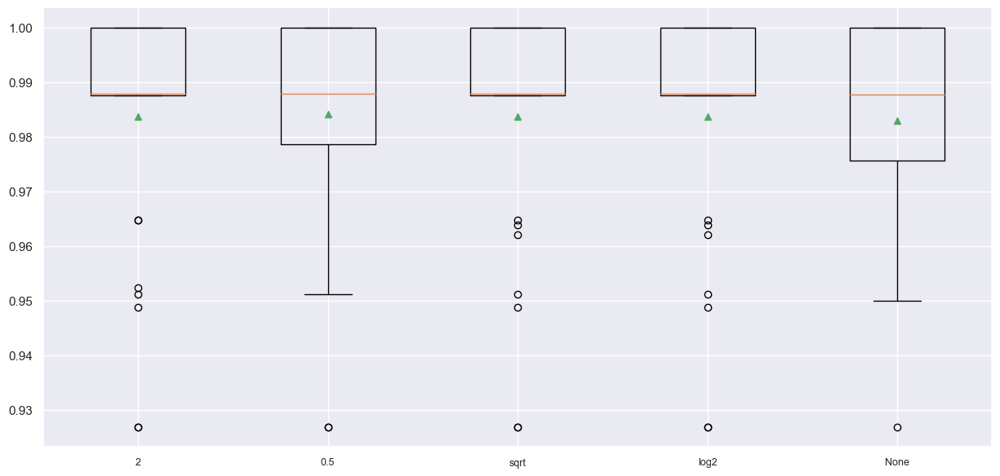

In [149]:
# max_features | The number of features to consider when looking for the best split.
# default = None
# Similarly to the number of samples, the number of features used to fit each decision tree can be varied, 
# and introduces additional variance into the model, which may improve performance, 
# although it might require an increase in the number of trees.

def get_models(values):
    models = dict()
    for value in values:
        models[str(value)] = GradientBoostingClassifier(learning_rate = 0.1, n_estimators = 500, max_features = value, random_state = 15)      
    return models

models = get_models([2,0.5,'sqrt','log2',None])
return_results(models)

In [150]:
model_gradient_boost = GradientBoostingClassifier(learning_rate = 0.1, n_estimators = 500, random_state = 15).fit(X_train, y_train)

In [151]:
# Predict the model with y_val
pred_val_gb = model_gradient_boost.predict(X_val)
print('Accuracy Score:' ,round(accuracy_score(y_val, pred_val_gb),3))
print('Precision Score:' ,round(precision_score(y_val, pred_val_gb),3))
print('Recall Score:' ,round(recall_score(y_val, pred_val_gb),3))
print('F1 Score:' ,round(f1_score(y_val, pred_val_gb),3))

Accuracy Score: 0.969
Precision Score: 0.975
Recall Score: 0.963
F1 Score: 0.969


In [152]:
# check the mean accuracy for the train
value_train = model_gradient_boost.score(X_train, y_train)
# check the mean accuracy for the validation
value_val = model_gradient_boost.score(X_val,y_val)
name = ['Training', 'Validation']
score = [value_train, value_val]
print(list(zip(name, score)))

[('Training', 1.0), ('Validation', 0.96875)]


In [153]:
# our best optimized model
#y_pred_gb = model_gradient_boost.predict(test)
#df = pd.DataFrame(y_pred_gb, index = test.index, columns = ['Disease'])
#df.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\Group34_Version37.csv', index=True)

<a class="anchor" id="TESING">

# 8. Model Testing

</a>

In [154]:
# Importing data

# Sociodemographic Data
test_demo = pd.read_excel('test_demo.xlsx')
# Health Related Data
test_habits = pd.read_excel('test_habits.xlsx')
# Habits related Data
test_health = pd.read_excel('test_health.xlsx')

merging data

In [155]:
# Checking if the provided tables share a forein key
print(test_demo["PatientID"].equals(test_habits["PatientID"]))
print(test_demo["PatientID"].equals(test_health["PatientID"]))
print(test_health["PatientID"].equals(test_habits["PatientID"]))

True
True
True


In [156]:
# Given that a forein key is shared we can now safely merge the three tables into a single dataframe
test_dataset = pd.merge(pd.merge(test_demo, test_habits, on="PatientID"),test_health,on="PatientID")
test_dataset = test_dataset [["PatientID","Name","Birth_Year","Region","Education","Height","Weight","Checkup","Diabetes","High_Cholesterol","Blood_Pressure","Mental_Health","Physical_Health","Exercise","Smoking_Habit","Drinking_Habit","Fruit_Habit","Water_Habit"]]
# And check the first 5 rows:
test_dataset.head(2)

,PatientID,Name,Birth_Year,Region,Education,Height,Weight,Checkup,Diabetes,High_Cholesterol,Blood_Pressure,Mental_Health,Physical_Health,Exercise,Smoking_Habit,Drinking_Habit,Fruit_Habit,Water_Habit
0,1343,Mr. Ricardo Sherman,1970,East Midlands,Elementary School (1st to 9th grade),172,80,Not sure,I have/had pregnancy diabetes or borderline di...,203,172,20,2,No,Yes,I usually consume alcohol every day,Less than 1. I do not consume fruits every day.,Between one liter and two liters
1,1727,Mr. Jessie Strickland,1966,Yorkshire and the Humber,University Complete (3 or more years),171,80,Not sure,I do have diabetes,225,130,21,0,No,No,I consider myself a social drinker,Less than 1. I do not consume fruits every day.,More than half a liter but less than one liter


In [157]:
# Check info about our dataset, and if there ware  missing values:
test_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 225 entries, 0 to 224
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   PatientID         225 non-null    int64 
 1   Name              225 non-null    object
 2   Birth_Year        225 non-null    int64 
 3   Region            225 non-null    object
 4   Education         225 non-null    object
 5   Height            225 non-null    int64 
 6   Weight            225 non-null    int64 
 7   Checkup           225 non-null    object
 8   Diabetes          225 non-null    object
 9   High_Cholesterol  225 non-null    int64 
 10  Blood_Pressure    225 non-null    int64 
 11  Mental_Health     225 non-null    int64 
 12  Physical_Health   225 non-null    int64 
 13  Exercise          225 non-null    object
 14  Smoking_Habit     225 non-null    object
 15  Drinking_Habit    225 non-null    object
 16  Fruit_Habit       225 non-null    object
 17  Water_Habit     

Transfom features

In [158]:
# Call the function feature_engineering 
test_dataset = feature_engineering(test_dataset)

# Change the order of the columns
test_dataset = test_dataset[["Age","Region","Education","Height","Weight","BMI_metric", "BMI_noneMetric", "Checkup","Diabetes","Cholesterol_value","Blood_Pressure_value","Mental_H_bad","Physical_H_bad","Exercise","Smoking_Habit","Drinking_Habit","Fruit_Habit","Water_Habit"]]
    
print(test_dataset.shape)
display(test_dataset.head())

(225, 18)


,Age,Region,Education,Height,Weight,BMI_metric,BMI_noneMetric,Checkup,Diabetes,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,Exercise,Smoking_Habit,Drinking_Habit,Fruit_Habit,Water_Habit
PatientID,,,,,,,,,,,,,,,,,,
1343,52,East midlands,0,172,80,27.041644,Overweight,2,2,203,172,20,2,No,Yes,Yes,0,2
1727,56,Yorkshire and the humber,2,171,80,27.358845,Overweight,2,3,225,130,21,0,No,No,No,0,1
1828,44,West midlands,0,171,78,26.674874,Overweight,1,2,237,130,24,1,Yes,No,Yes,0,2
1155,54,Yorkshire and the humber,0,174,87,28.735632,Overweight,2,3,313,108,19,0,No,No,Yes,0,0
1020,60,East midlands,0,172,56,18.929151,Normal,1,2,189,140,19,14,No,No,No,0,0


Numeric Variables

In [159]:
test_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,225.0,54.355556,9.438607,34.000000,47.00000,55.000000,61.000000,77.000000
Height,225.0,167.422222,8.014743,151.000000,162.00000,167.000000,173.000000,180.000000
Weight,225.0,67.800000,12.758750,42.000000,57.00000,68.000000,77.000000,97.000000
BMI_metric,225.0,24.134303,3.883566,16.824227,20.86112,24.111507,27.609452,30.071168
Cholesterol_value,225.0,252.408889,51.727410,135.000000,217.00000,244.000000,278.000000,421.000000
Blood_Pressure_value,225.0,133.595556,18.983098,94.000000,120.00000,130.000000,144.000000,200.000000
Mental_H_bad,225.0,17.546667,4.902514,3.000000,15.00000,18.000000,22.000000,27.000000
Physical_H_bad,225.0,5.377778,6.061032,0.000000,0.00000,4.000000,9.000000,30.000000


In [160]:
metric_features = test_dataset.describe().columns.to_list()
metric_features

['Age',
 'Height',
 'Weight',
 'BMI_metric',
 'Cholesterol_value',
 'Blood_Pressure_value',
 'Mental_H_bad',
 'Physical_H_bad']

In [161]:
test_dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 225 entries, 1343 to 1757
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Age                   225 non-null    int64  
 1   Region                225 non-null    object 
 2   Education             225 non-null    object 
 3   Height                225 non-null    int64  
 4   Weight                225 non-null    int64  
 5   BMI_metric            225 non-null    float64
 6   BMI_noneMetric        225 non-null    object 
 7   Checkup               225 non-null    object 
 8   Diabetes              225 non-null    object 
 9   Cholesterol_value     225 non-null    int64  
 10  Blood_Pressure_value  225 non-null    int64  
 11  Mental_H_bad          225 non-null    int64  
 12  Physical_H_bad        225 non-null    int64  
 13  Exercise              225 non-null    object 
 14  Smoking_Habit         225 non-null    object 
 15  Drinking_Habit     

In [162]:
# Outlier handling Solution 1 - Substitute the extreme values, by a maximun value, on each feature, 
# the same as in the main dataset

df_test_extreme = test_dataset.copy()

Age_test = df_test_extreme["Age"].copy()
Age_test.loc[Age_test>100] = 100
df_test_extreme["Age"] = Age_test

Cholesterol_value_test = df_test_extreme["Cholesterol_value"].copy()
Cholesterol_value_test.loc[Cholesterol_value_test>380] = 380
df_test_extreme["Cholesterol_value"] = Cholesterol_value_test

Blood_Pressure_value_test = df_test_extreme["Blood_Pressure_value"].copy()
Blood_Pressure_value_test.loc[Blood_Pressure_value_test>180] = 180
df_test_extreme["Blood_Pressure_value"] = Blood_Pressure_value_test

In [163]:
# Solution 1 is to be used
test_dataset = df_test_extreme.copy()
test_dataset.shape

(225, 18)

Scaling data
We need to change - scaler_hot_enc or scaler_kfold

In [164]:
test_num_scaled_hot = scaler_hot_enc.transform(test_dataset[metric_features]) 

test_num_scaled_hot = pd.DataFrame(test_num_scaled_hot, columns = test_dataset[metric_features].columns).set_index(test_dataset[metric_features].index)

test_dataset_hot = pd.concat([test_dataset.drop(columns=metric_features), test_num_scaled_hot], axis=1)

Categorical Featrues

In [165]:
test_dataset.describe(include=['O']).T

,count,unique,top,freq
Region,225,9,London,50
Education,225,3,2,92
BMI_noneMetric,225,3,Normal,103
Checkup,225,3,1,115
Diabetes,225,4,0,105
Exercise,225,2,No,144
Smoking_Habit,225,2,No,199
Drinking_Habit,225,2,No,118
Fruit_Habit,225,4,0,126
Water_Habit,225,3,2,112


In [166]:
n_metric_features = test_dataset.describe(include=['O']).columns.to_list()
n_metric_features

['Region',
 'Education',
 'BMI_noneMetric',
 'Checkup',
 'Diabetes',
 'Exercise',
 'Smoking_Habit',
 'Drinking_Habit',
 'Fruit_Habit',
 'Water_Habit']

Drop Features

In [167]:
# Drop features that were dropped in the train and validation datasets
test_dataset_hot = test_dataset_hot.drop(["Height","Weight", "BMI_metric"], axis = 1)

test_dataset_hot = test_dataset_hot.drop(["Region", "Education", "Water_Habit", "Smoking_Habit"], axis = 1)

metric_features = [e for e in metric_features if e not in ("Height","Weight", "BMI_metric")]
n_metric_features = [e for e in n_metric_features if e not in ("Region", "Education", "Water_Habit", "Smoking_Habit")]

Encode categorical variables

In [168]:
# Encode categorical variables

ohc_hot = OneHotEncoder(sparse=False, drop='first')
ohc_feat_hot = ohc.fit_transform(test_dataset_hot[n_metric_features])
ohc_feat_names_hot = ohc.get_feature_names_out()
ohc_df_hot = pd.DataFrame(ohc_feat_hot, index=test_dataset_hot[n_metric_features].index, columns=ohc_feat_names_hot) 
ohc_df_hot

,BMI_noneMetric_Overweight,BMI_noneMetric_Underweight,Checkup_1,Checkup_2,Diabetes_1,Diabetes_2,Diabetes_3,Exercise_Yes,Drinking_Habit_Yes,Fruit_Habit_1,Fruit_Habit_2,Fruit_Habit_3
PatientID,,,,,,,,,,,,
1343,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1727,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1828,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
1155,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
1020,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1000,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1256,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1318,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0


In [169]:
# Reassigning df to contain ohc variables
test_dataset_hot = pd.concat([test_dataset_hot.drop(columns=n_metric_features), ohc_df_hot], axis=1)
test_dataset_hot.head()

,Age,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,BMI_noneMetric_Overweight,BMI_noneMetric_Underweight,Checkup_1,Checkup_2,Diabetes_1,Diabetes_2,Diabetes_3,Exercise_Yes,Drinking_Habit_Yes,Fruit_Habit_1,Fruit_Habit_2,Fruit_Habit_3
PatientID,,,,,,,,,,,,,,,,,
1343,0.323944,0.292,0.906977,0.689655,0.074074,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1727,0.380282,0.380,0.418605,0.724138,0.000000,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1828,0.211268,0.428,0.418605,0.827586,0.037037,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
1155,0.352113,0.732,0.162791,0.655172,0.000000,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
1020,0.436620,0.236,0.534884,0.655172,0.518519,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [170]:
# Rename Categorical columns , to strat with 'c_', to be able to distinguish it

# Assemble OHE columns and their new column names
rename_ohe_cols = {}

for i in n_metric_features:
    for j in test_dataset_hot.columns[test_dataset_hot.columns.str.startswith(i)].to_list() :
        rename_ohe_cols[j] = 'c_' + j

test_dataset_hot.rename(columns=rename_ohe_cols, inplace=True)

test_dataset_hot.head()

,Age,Cholesterol_value,Blood_Pressure_value,Mental_H_bad,Physical_H_bad,c_BMI_noneMetric_Overweight,c_BMI_noneMetric_Underweight,c_Checkup_1,c_Checkup_2,c_Diabetes_1,c_Diabetes_2,c_Diabetes_3,c_Exercise_Yes,c_Drinking_Habit_Yes,c_Fruit_Habit_1,c_Fruit_Habit_2,c_Fruit_Habit_3
PatientID,,,,,,,,,,,,,,,,,
1343,0.323944,0.292,0.906977,0.689655,0.074074,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
1727,0.380282,0.380,0.418605,0.724138,0.000000,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1828,0.211268,0.428,0.418605,0.827586,0.037037,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0
1155,0.352113,0.732,0.162791,0.655172,0.000000,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
1020,0.436620,0.236,0.534884,0.655172,0.518519,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [171]:
# Export clean test CSV

# test_dataset_hot.to_csv(r'/Users/pedroanastacio/Desktop/University/2022/MachineLearning22/Project/testPreProcessed.csv', index=True)

In [172]:
test = test_dataset_hot

In [173]:
# test_dataset_hot

In [174]:
# # Export csv

# test_dataset_hot.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\test_hot.csv', index=True)
# test_dataset_kfold.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\test_kfold.csv', index=True)

<a class="anchor" id="TESING">

# 9. Model Deployment 

</a>

In [175]:
# our best optimized model
y_pred = log_model_l2.predict(test)
df = pd.DataFrame(y_pred, index = test.index, columns = ['Disease'])
df.to_csv(r'C:\Users\katxi\OneDrive\Mestrado\Machine_Learning\Master\Project\Versions\Final\Group34_Version44.csv', index=True)